In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Step - 1
# Introduction

### Data description
- The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate.
### Objective
- Finding the outliers and missing values in each numerical column and treating them
- Understanding the probability and frequency distribution of each numerical column and categorical Variable/Column using  PDF, Histograms, Boxplots, Countplots, etc.
- Discovering the relationships  and insights between all the columns using  Scatter plots,pair plots,stacked bar plots etc.
- Solving the Research Questions
 1. Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.
 2. Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)
- Determining the Conclusion about overall data

### The Data Dictionary

In [411]:
data_dict

,VARIABLES,TYPE,Description
0,ID,UID,A unique ID to identify a candidate
1,Salary,Continuous,Annual CTC oﬀered to the candidate (in INR)
2,DOJ,Date,Date of joining the company
3,DOL,Date,Date of leaving the company
4,Designation,Categorical,Designation oﬀered in the job
5,JobCity,Categorical,Location of the job (city)
6,Gender,Categorical,Candidate’s gender
7,DOB,Date,Date of birth of candidate
8,10percentage,Continuous,Overall marks obtained in grade 10 examinations
9,10board,Continuous,The school board whose curriculum the candidat...


# Step - 2
## Import the data

In [935]:
pd.set_option('display.max_rows', 60)

In [129]:
data =  pd.read_csv("data.xlsx - Sheet1.csv")

In [185]:
df = pd.read_csv("data.xlsx - Sheet1.csv")

## Display the head

In [3]:
data.head(10)


,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.30,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.40,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.00,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.60,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.00,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
5,train,1027655,300000.0,6/1/14 0:00,present,system engineer,Hyderabad,m,7/2/92 0:00,89.92,...,407,-1,-1,-1,-1,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608
6,train,947847,300000.0,8/1/14 0:00,5/1/15 0:00,java software engineer,Banglore,m,2/1/93 0:00,86.08,...,346,-1,-1,-1,-1,1.7081,-0.1054,-1.0379,-2.00920,-1.0872
7,train,912934,400000.0,7/1/14 0:00,7/1/15 0:00,mechanical engineer,Bangalore,m,5/27/92 0:00,92.00,...,-1,469,-1,-1,-1,-0.0154,1.2114,0.0100,0.14590,1.2470
8,train,552574,600000.0,7/1/13 0:00,present,electrical engineer,Noida,m,9/17/91 0:00,90.00,...,-1,-1,-1,-1,-1,-0.1590,0.5454,-0.6048,-0.74150,-0.2859
9,train,1203363,230000.0,7/1/14 0:00,present,project engineer,Kolkata,m,6/13/93 0:00,77.00,...,-1,-1,-1,-1,-1,-1.3080,0.5454,-0.9122,0.90660,0.0973


## Shape

In [4]:
data.shape

(3998, 39)

##  Description of the data


In [130]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             3998 non-null   object 
 1   ID                     3998 non-null   int64  
 2   Salary                 3998 non-null   float64
 3   DOJ                    3998 non-null   object 
 4   DOL                    3998 non-null   object 
 5   Designation            3998 non-null   object 
 6   JobCity                3998 non-null   object 
 7   Gender                 3998 non-null   object 
 8   DOB                    3998 non-null   object 
 9   10percentage           3998 non-null   float64
 10  10board                3998 non-null   object 
 11  12graduation           3998 non-null   int64  
 12  12percentage           3998 non-null   float64
 13  12board                3998 non-null   object 
 14  CollegeID              3998 non-null   int64  
 15  Coll

In [131]:
data[["CollegeTier","CollegeCityTier"]] = data[["CollegeTier","CollegeCityTier"]].astype("object")

In [132]:
from datetime import datetime
today_date = datetime.today().strftime('%m/%d/%y')
data["DOL"] = data["DOL"].apply(lambda x: today_date if x == 'present' else x)

# Step - 3
# Univariate Analysis - Statistical Non Visual and Visual Analysis

In [133]:
data["Unnamed: 0"].value_counts()

train    3998
Name: Unnamed: 0, dtype: int64

- Column "Unnamed: 0" has zero variance. So, the column is droped

In [134]:
data = data.drop("Unnamed: 0",axis=1)

In [135]:
data["ID"].nunique()

3998

### Univariate analysis on discrete varibales

In [136]:
numerical_data = data[["Salary","10percentage","12percentage","collegeGPA","English","Logical",
                  "Quant", "Domain","ComputerProgramming","ElectronicsAndSemicon","ComputerScience",
                  "MechanicalEngg","ElectricalEngg","TelecomEngg", "CivilEngg","conscientiousness","agreeableness",
                  "extraversion","nueroticism","openess_to_experience"]]

discrete_data = data.drop(columns=numerical_data, axis=1)

In [174]:
discrete_data = discrete_data.drop("CollegeCityID",axis=1)

In [175]:
discrete_data = discrete_data.drop("CollegeID",axis=1)

In [176]:
discrete_data = discrete_data.drop("ID",axis=1)

In [1053]:
def discrete_univariate_analysis(discrete_data):
    for col_name in discrete_data:
        print("*"*10, col_name, "*"*10)
        print(discrete_data[col_name].agg(['count', 'nunique', 'unique']))
        print('Value Counts: \n', discrete_data[col_name].value_counts())
        cats = discrete_data[col_name].value_counts()
        plt.figure()
        cats.head(10).plot(kind='bar')
        plt.xlabel('Category')
        plt.ylabel('Frequency')
        plt.xticks(rotation=90, ha='right')
        plt.tight_layout()
        plt.savefig('graph.png')
        plt.show()
        print()


In [1049]:
def single_var_discrete_univariate_analysis(discrete_data):
    print(discrete_data.agg(['count', 'nunique', 'unique']))
    cats = discrete_data.value_counts()
    plt.figure(figsize=(24,8))
    cats.head(100).plot(kind='bar')
    plt.xlabel('Category')
    plt.ylabel('Frequency')
    plt.xticks(rotation=90, ha='right')
    plt.tight_layout()
    plt.show()
    print()

********** DOJ **********
count                                                   3998
nunique                                                   81
unique     [6/1/12 0:00, 9/1/13 0:00, 6/1/14 0:00, 7/1/11...
Name: DOJ, dtype: object
Value Counts: 
 7/1/14 0:00     199
6/1/14 0:00     180
8/1/14 0:00     178
9/1/14 0:00     142
1/1/14 0:00     142
               ... 
11/1/15 0:00      1
11/1/09 0:00      1
8/1/04 0:00       1
9/1/09 0:00       1
2/1/07 0:00       1
Name: DOJ, Length: 81, dtype: int64


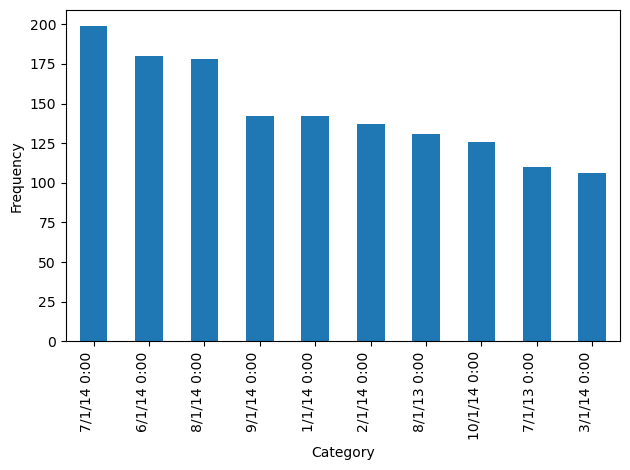


********** DOL **********
count                                                   3998
nunique                                                   67
unique     [02/18/24, 3/1/15 0:00, 5/1/15 0:00, 7/1/15 0:...
Name: DOL, dtype: object
Value Counts: 
 02/18/24        1875
4/1/15 0:00      573
3/1/15 0:00      124
5/1/15 0:00      112
1/1/15 0:00       99
                ... 
3/1/05 0:00        1
10/1/15 0:00       1
2/1/10 0:00        1
2/1/11 0:00        1
10/1/10 0:00       1
Name: DOL, Length: 67, dtype: int64


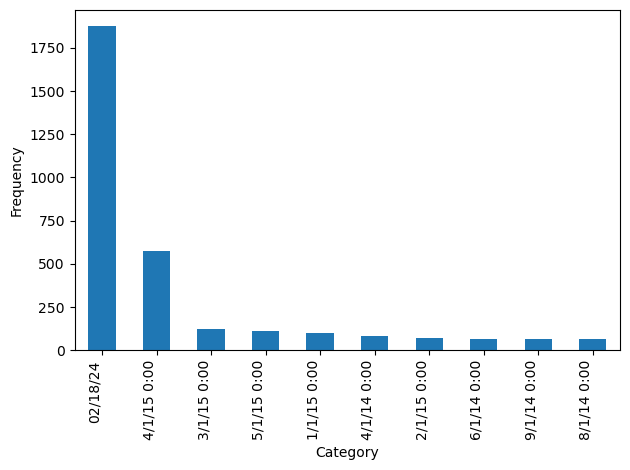


********** Designation **********
count                                                   3998
nunique                                                  419
unique     [senior quality engineer, assistant manager, s...
Name: Designation, dtype: object
Value Counts: 
 software engineer                    539
software developer                   265
system engineer                      205
programmer analyst                   139
systems engineer                     118
                                    ... 
cad drafter                            1
noc engineer                           1
human resources intern                 1
senior quality assurance engineer      1
jr. software developer                 1
Name: Designation, Length: 419, dtype: int64


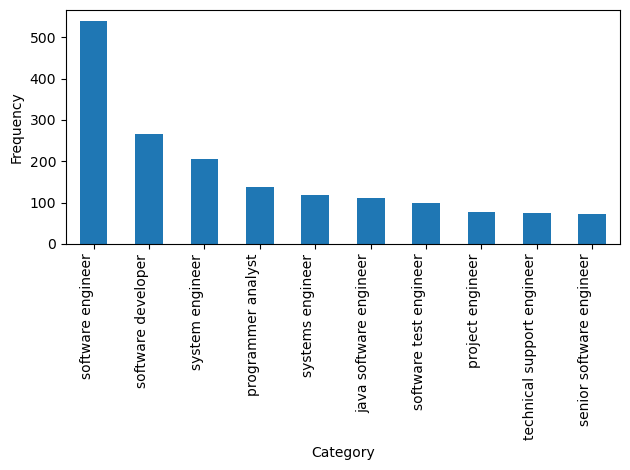


********** JobCity **********
count                                                   3998
nunique                                                  339
unique     [Bangalore, Indore, Chennai, Gurgaon, Manesar,...
Name: JobCity, dtype: object
Value Counts: 
 Bangalore           627
-1                  461
Noida               368
Hyderabad           335
Pune                290
                   ... 
Tirunelvelli          1
Ernakulam             1
Nanded                1
Dharmapuri            1
Asifabadbanglore      1
Name: JobCity, Length: 339, dtype: int64


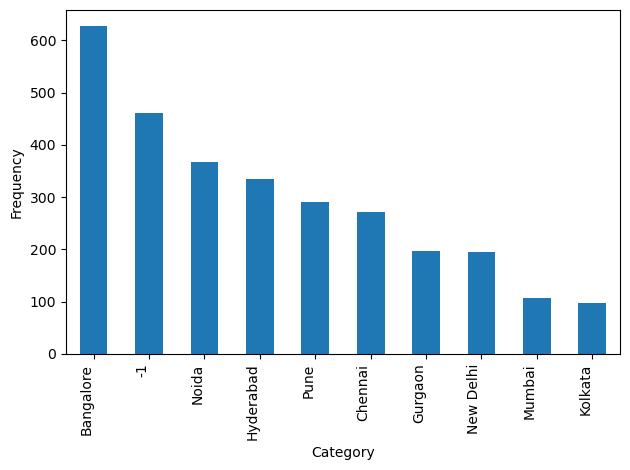


********** Gender **********
count        3998
nunique         2
unique     [f, m]
Name: Gender, dtype: object
Value Counts: 
 m    3041
f     957
Name: Gender, dtype: int64


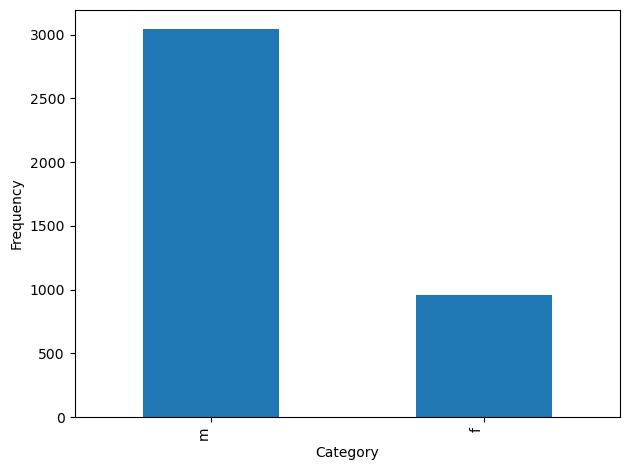


********** DOB **********
count                                                   3998
nunique                                                 1872
unique     [2/19/90 0:00, 10/4/89 0:00, 8/3/92 0:00, 12/5...
Name: DOB, dtype: object
Value Counts: 
 1/1/91 0:00      11
7/15/91 0:00     10
7/5/91 0:00       8
12/13/91 0:00     8
6/3/91 0:00       8
                 ..
12/30/92 0:00     1
10/20/86 0:00     1
11/17/89 0:00     1
9/30/92 0:00      1
4/15/87 0:00      1
Name: DOB, Length: 1872, dtype: int64


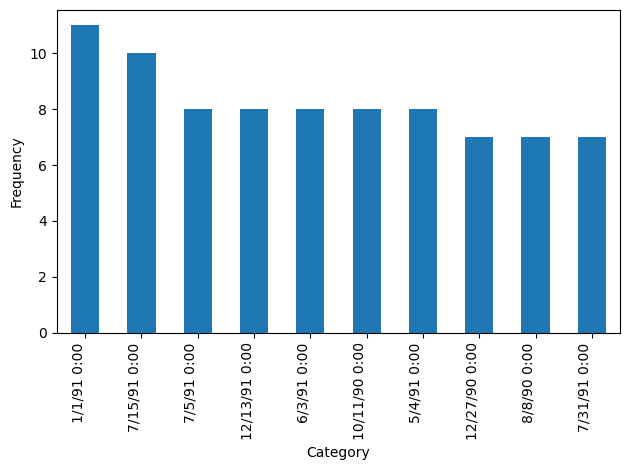


********** 10board **********
count                                                   3998
nunique                                                  275
unique     [board ofsecondary education,ap, cbse, state b...
Name: 10board, dtype: object
Value Counts: 
 cbse                          1395
state board                   1164
0                              350
icse                           281
ssc                            122
                              ... 
hse,orissa                       1
national public school           1
nagpur board                     1
jharkhand academic council       1
bse,odisha                       1
Name: 10board, Length: 275, dtype: int64


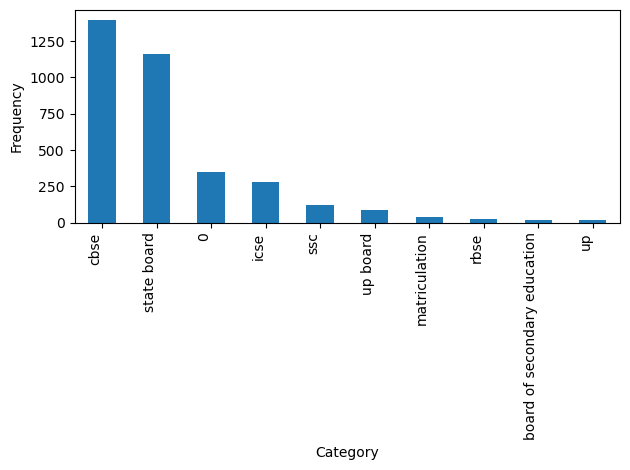


********** 12graduation **********
count                                                   3998
nunique                                                   16
unique     [2007, 2010, 2008, 2009, 2006, 2011, 2005, 199...
Name: 12graduation, dtype: object
Value Counts: 
 2009    1052
2008     935
2010     742
2007     528
2006     407
2005     160
2004      73
2011      46
2003      25
2002      14
2012      10
2001       2
1995       1
1998       1
2013       1
1999       1
Name: 12graduation, dtype: int64


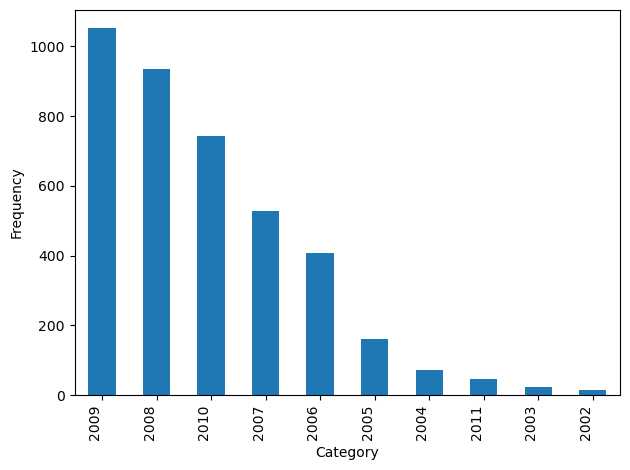


********** 12board **********
count                                                   3998
nunique                                                  340
unique     [board of intermediate education,ap, cbse, sta...
Name: 12board, dtype: object
Value Counts: 
 cbse                                1400
state board                         1254
0                                    359
icse                                 129
up board                              87
                                    ... 
jawahar higher secondary school        1
nagpur board                           1
bsemp                                  1
board of higher secondary orissa       1
boardofintermediate                    1
Name: 12board, Length: 340, dtype: int64


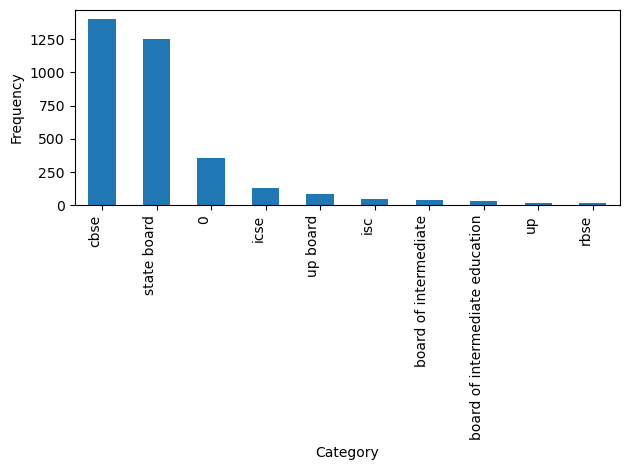


********** CollegeTier **********
count        3998
nunique         2
unique     [2, 1]
Name: CollegeTier, dtype: object
Value Counts: 
 2    3701
1     297
Name: CollegeTier, dtype: int64


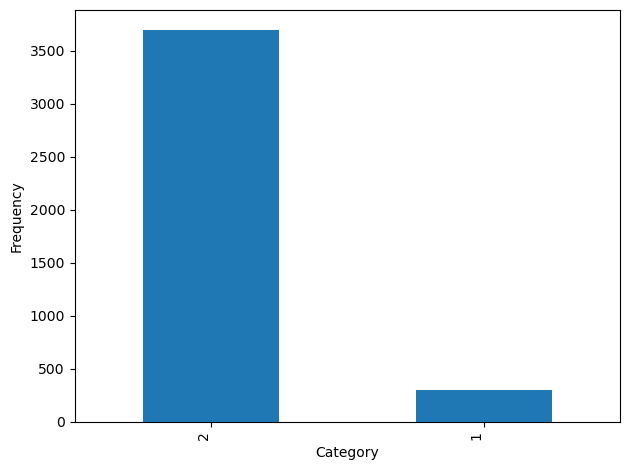


********** Degree **********
count                                                 3998
nunique                                                  4
unique     [B.Tech/B.E., MCA, M.Tech./M.E., M.Sc. (Tech.)]
Name: Degree, dtype: object
Value Counts: 
 B.Tech/B.E.      3700
MCA               243
M.Tech./M.E.       53
M.Sc. (Tech.)       2
Name: Degree, dtype: int64


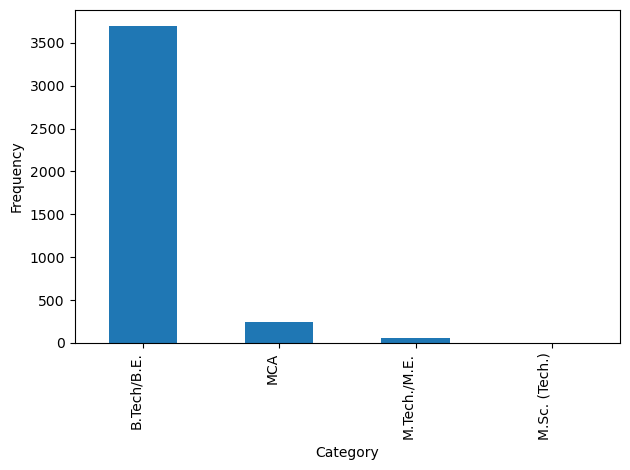


********** Specialization **********
count                                                   3998
nunique                                                   46
unique     [computer engineering, electronics and communi...
Name: Specialization, dtype: object
Value Counts: 
 electronics and communication engineering      880
computer science & engineering                 744
information technology                         660
computer engineering                           600
computer application                           244
mechanical engineering                         201
electronics and electrical engineering         196
electronics & telecommunications               121
electrical engineering                          82
electronics & instrumentation eng               32
civil engineering                               29
electronics and instrumentation engineering     27
information science engineering                 27
instrumentation and control engineering         20
electronics e

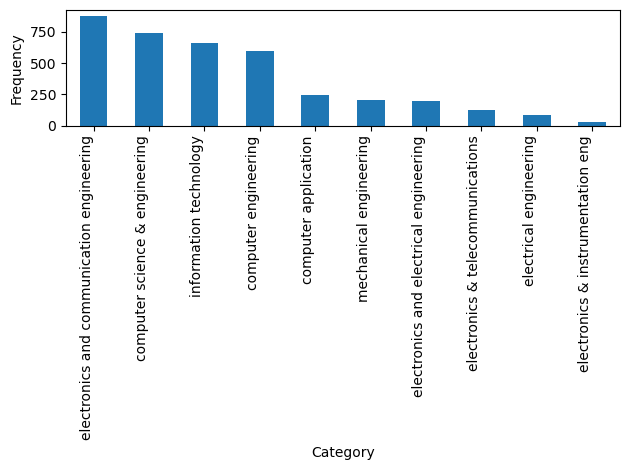


********** CollegeCityTier **********
count        3998
nunique         2
unique     [0, 1]
Name: CollegeCityTier, dtype: object
Value Counts: 
 0    2797
1    1201
Name: CollegeCityTier, dtype: int64


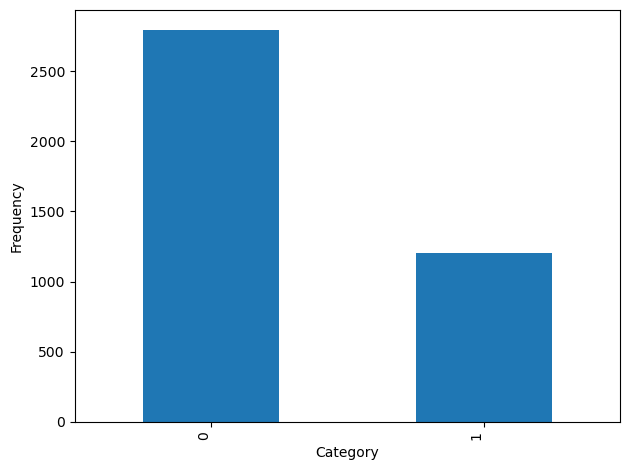


********** CollegeState **********
count                                                   3998
nunique                                                   26
unique     [Andhra Pradesh, Madhya Pradesh, Uttar Pradesh...
Name: CollegeState, dtype: object
Value Counts: 
 Uttar Pradesh        915
Karnataka            370
Tamil Nadu           367
Telangana            319
Maharashtra          262
Andhra Pradesh       225
West Bengal          196
Punjab               193
Madhya Pradesh       189
Haryana              180
Rajasthan            174
Orissa               172
Delhi                162
Uttarakhand          113
Kerala                33
Jharkhand             28
Chhattisgarh          27
Gujarat               24
Himachal Pradesh      16
Bihar                 10
Jammu and Kashmir      7
Assam                  5
Union Territory        5
Sikkim                 3
Meghalaya              2
Goa                    1
Name: CollegeState, dtype: int64


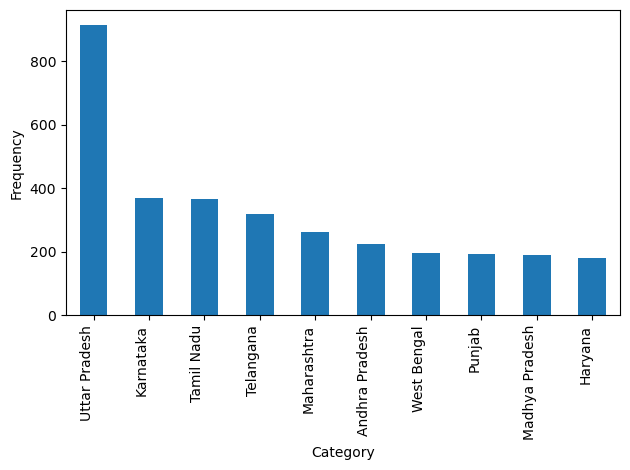


********** GraduationYear **********
count                                                   3998
nunique                                                   11
unique     [2011, 2012, 2014, 2016, 2013, 2010, 2015, 200...
Name: GraduationYear, dtype: object
Value Counts: 
 2013    1181
2014    1036
2012     847
2011     507
2010     292
2015      94
2009      24
2017       8
2016       7
0          1
2007       1
Name: GraduationYear, dtype: int64


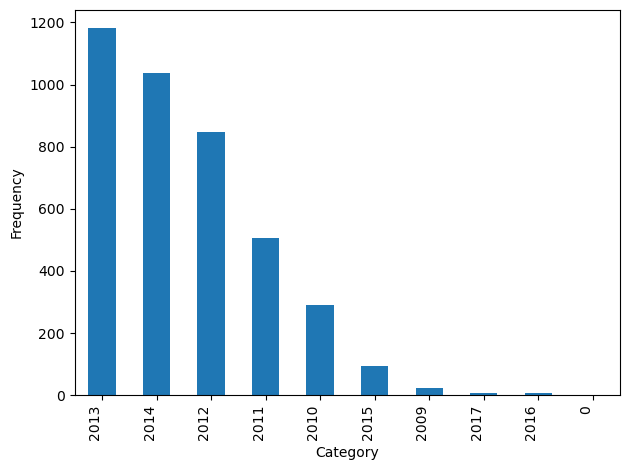

In [1054]:
discrete_univariate_analysis(discrete_data)

### Observations of each discrete column 
- DOJ is a Datetime column with 81 dates of nunique joining dates. Mostof the candidates had joined their job in 2014 in th month of july

- DOL is a Datetime column with 67 dates of nunique leaving dates. Out of 3998 candidates only 1875 people are still working.

- Designation is a categorical column with 419 categories of Designation but it looks like there are some repeated designations because of spelling mistakes.

- JobCity is a categorical column with 339 categories of City names but it looks like there some missing values present and there also some repeated city names because of spelling mistakes, capital letters and small letters.

- Gender is a categorical column with 2 categories of genders. There are more Male candidates than Female

- DOB is a Datetime column out of 3998 candidates there are 1872 dates of Unique birth dates

- 10board is a categorical column with 275 categories of exam names but it looks like there some Nan values present and there also some repeated exam names because of spelling mistakes, capital letters and small letters. Most of the candidates are from CBSE

- 12graduation is a Datetime column with 16 nunique year values. Most of the candidates completed their 12th graduation in the year 2009

- 12board is a categorical column with 340 categories of exam names but it looks like there some Nan values present and there also some repeated exam names because of spelling mistakes, capital letters and small letters.Most of the candidates are from CBSE

- CollegeTier is a categorical column with 2 categories of College Tiers. Most of their collages are 2nd tier collages

- Degree is a categorical column with 4 categories of Degrees. All are B.tech graduates but some of them also did MCA and M.Tech.

- Specialization is a categorical column with 46 categories of exam names but it looks like there are some repeated Specialization names because of spelling mistakes, capital letters and small letters. Most of the candidates are Specialized in electronics and communication engineering

- CollegeCityTier is a categorical column with 2 categories of College City Tiers. Most of them are from 0 tier cities
- CollegeState is a categorical column with 26 categories of CollegeState. Most of candidates colleges are in Uttar Pradesh and only one of the candidate collage is in Goa

- GraduationYear is a Datetime column with 11 Graduation Year values but looks there are some NA values. Most of them graduated in 2014

### Fixing Designation Column

In [516]:
data["Designation"] =data["Designation"].str.lower()

In [517]:
data["Designation"] =data["Designation"].str.strip()

In [519]:
data["Designation"]=data["Designation"].apply(lambda x: "quality analyst" if x=="qa analyst" else x)

In [520]:
from fuzzywuzzy import process

def correcting_spelling_errors(target_word="",choices=[],threshold=90):
    match,score = process.extractOne(target_word,choices)
    if score>=threshold:
        return match
    else:
        return target_word

In [897]:
choices = ['senior quality engineer', 'assistant manager', 'systems engineer',
       'senior software engineer', 'get',
       'java software engineer', 'mechanical engineer',
       'electrical engineer', 'project engineer', 'senior php developer',
       'senior systems engineer', 'quality assurance engineer', 'network engineer', 'product development engineer',
       'associate software developer', 'data entry operator',
       'software engineer', 'developer', 'electrical project engineer',
       'programmer analyst', 'systems analyst', 'ase',
       'telecommunication engineer', 'application developer',
       'ios developer', 'executive assistant', 'online marketing manager',
       'documentation specialist', 'associate software engineer',
       'management trainee', 'site manager', 'software developer', 'production engineer',
       'trainee software developer', 'ui developer','android developer',
       'customer service', 'test engineer', 'java developer', 'engineer',
       'recruitment coordinator', 'technical support engineer',
       'data analyst', 'assistant software engineer', 'faculty',
       'entry level management trainee',
       'customer service representative', 'software test engineer',
       'firmware engineer', 'php developer', 'research associate',
       'research analyst', 'quality engineer', 'programmer',
       'technical support executive', 'business analyst', 'web developer',
       'application engineer', 'project coordinator', 'engineer trainee',
       'sap consultant', 'quality analyst', 'marketing coordinator',
       'system administrator', 'senior engineer',
       'business development manager', 'network administrator',
       'technical support specialist', 'business development executive',
       'junior software engineer', 'asp.net developer',
       'graduate engineer trainee', 'field engineer',
       'assistant professor', 'trainee software engineer',
       'senior software developer',
       'quality assurance automation engineer', 'design engineer',
       'telecom engineer', 'quality control engineer',
       'hardware engineer', 'hr recruiter', 'sales associate',
       'junior engineer', 'associate engineer', 'maintenance engineer','.net web developer',
       'sales engineer', 'human resources associate',
       'mobile application developer',
       'electronic field service engineer', 'process associate',
       'field service engineer', 'it support specialist',
       'software development engineer', 'business process analyst',
       'operation engineer', 'electrical designer', 'marketing assistant',
       'sales executive', 'admin assistant', 'senior java developer',
       'account executive', 'oracle dba', 'rf engineer',
       'embedded software engineer', 'programmer analyst trainee',
       'technical engineer', 'operations executive', 'lecturer',
       'marketing executive', 'operations assistant', 'associate manager',
       'electrical design engineer', 'systems administrator',
       'client services associate', 'it analyst', 'senior developer',
       'cad designer', 'business technology analyst', 'asst. manager',
       'service engineer', 'executive recruiter', 'planning engineer',
       'associate technical operations', 'web designer',
       'software architect', 'software quality assurance tester',
       'seo trainee', 'process engineer',
       'software quality assurance analyst', 'designer',
       'business systems consultant', 'business development manager',
       'junior research fellow', 'technical recruiter',
       'operations analyst', 'quality assurance test engineer',
       'linux systems administrator', 'software trainee',
       'entry level sales and marketing', 'electrical field engineer',
       'windows systems administrator', 'junior software developer',
       'python developer', 'web application developer',
       'assistant systems engineer', 'javascript developer',
       'operation executive', 'performance engineer', 'technical writer',
       'operations engineer and jetty handling', 'lead engineer',
       'portfolio analyst', 'associate system engineer',
       'mechanical design engineer', 'product engineer',
       'network security engineer', 'operations manager',
       'technical lead', 'operations', 'quality assurance tester',
       'automation engineer', 'data scientist', 'quality associate',
       'manual tester', 'sr. engineer', 'embedded engineer', 'telecom support engineer',
       'engineer- customer support', 'cloud engineer', 'branch manager',
       'business analyst consultant', 'technology lead', 'dcs engineer', 'junior manager',
       'ux designer', 'clerical', 'hr generalist',
       'database administrator', 'senior design engineer', 'seo',
       'assistant engineer', 'marketing analyst', 'it executive',
       'salesforce developer', 'software tester', 'sql dba',
       'junior engineer product support', 'manager',
       'senior business analyst', 'c# developer',
       'implementation engineer', 'executive hr', 'executive engineer',
       'sharepoint developer',
       'sales management trainee', 'senior project engineer',
       'it recruiter', 'software engineer analyst',
       'desktop support technician', 'continuous improvement engineer',
       'process advisor', 'etl developer', 'sales and service engineer',
       'project manager', 'training specialist', 'product manager',
       'staffing recruiter', 'assistant programmer', 'quality controller',
       'mis executive', 'game developer', 'digital marketing specialist',
       'principal software engineer',
       'senior mechanical engineer', 'technical operations analyst',
       'service coordinator', 'testing engineer', 'technical assistant',
       'sap abap consultant', 'seo engineer', 'project assistant',
       'talent acquisition specialist', 'sales account manager', 'customer service manager',
       'help desk analyst', 'general manager', 'engineering manager',
       'senior network engineer',
       'field based employee relations manager', 'phone banking officer',
       'support engineer', 'associate test engineer',
       'technology analyst', 'network support engineer',
       'it business analyst', 'junior system analyst',
       'senior .net developer', 'secretary', 'research engineer',
       'quality assurance auditor', 'process executive',
       'lecturer & electrical maintenance', 'office coordinator',
       'hr manager', 'html developer', 'sales support',
       'front end web developer', 'administrative support',
       'territory sales manager', 'project administrator',
       'environmental engineer', 'web designer and seo',
       'information security analyst',
       'field business development associate', 'operational executive',
       'administrative coordinator', 'senior risk consultant',
       'desktop support engineer', 'cad drafter', 'noc engineer',
       'industrial engineer', 'it engineer', 'human resources intern',
       'senior quality assurance engineer', 'clerical assistant','quality assurance',
       'delivery software engineer', 'graphic designer',
       'sales development manager', 'visiting faculty',
       'business intelligence analyst', 'team lead',
       'operational excellence manager',
       'web intern', 'full stack developer', 'database developer',
       'sr. database engineer', 'graduate apprentice trainee',
       'software engineer associate', 'technical analyst',
       'executive engg', 'it technician', 'business system analyst',
       'process control engineer', 'technical consultant',
       'business office manager', 'quality control inspector',
       'product design engineer', 'manufacturing engineer',
       'seo executive', 'sap analyst',
       'financial service consultant', 'co faculty', 'software analyst',
       'desktop support analyst', 'graduate engineer',
       'engineering technician', 'it assistant', 'marketing manager',
       'human resource assistant', 'hr assistant',
       'customer support engineer',
       'quality control inspection technician', 'gis/cad engineer',
       'senior web developer', 'sql developer', 'research staff member',
       'sap abap associate consultant', 'associate qa',
       'corporate recruiter', 'project management officer', 'software programmer',
       'help desk technician', 'sales manager', 'catalog associate',
       'assistant store manager', 'it developer',
       'apprentice', 'business consultant', 'controls engineer',
       'ruby on rails developer', 'risk consultant', 'account manager',
       'professor', 'assistant administrator', 'civil engineer',
       'educator', 'service manager', 'teradata dba',
       'full-time loss prevention associate', 'junior recruiter',
       'associate developer', 'assistant electrical engineer',
       'shift engineer', 'dotnet developer', 'rf/dt engineer',
       'human resources analyst',
       'junior .net developer', 'java trainee', 'maintenance supervisor',
       'r&d engineer', 'front end developer', 'engineer-hws',
       'operations engineer', 'senior research fellow',
       'web designer and joomla administrator',
       'enterprise solutions developer',
       'information technology specialist', 'site engineer',
       'graduate trainee engineer', 'quality assurance analyst',
       'cnc programmer', 'financial analyst', 'system engineer trainee',
       'sap mm consultant', 'assistant system engineer trainee',
       'qa trainee', 'teradata developer', 'hr executive',
       'senior programmer', 'software test engineer (etl)', 'supply chain analyst', 'sales trainer',
       'software executive', 'team leader', 'seo analyst',
       'risk investigator', 'executive administrative assistant',
       'program manager', 'r & d', 'sap functional consultant',
       'website developer/tester', 'software designer',
       'sales coordinator', 'qa engineer', 'aircraft technician',
       'customer care executive', 'senior test engineer', 'electrical controls engineer',
       'trainee decision scientist', 'editor', 'bss engineer', 'dba', 'computer faculty', 'recruitment associate',
       'logistics executive', 'quality consultant','.net developer',
       'senior sales executive', 'db2 dba', 'test technician',
       'it operations associate',
       'research scientist']

In [899]:
data["Designation"] =data["Designation"].apply(lambda Designation:correcting_spelling_errors(target_word=Designation,choices=choices))

In [900]:
data["Designation"]=data["Designation"].apply(lambda x: "software engineer" if x=="software engg" else x)

In [901]:
data['Designation']=data['Designation'].str.replace("jr. software engineer","junior software engineer",regex=False)

In [902]:
data["Designation"].nunique()

395

count                                                   3998
nunique                                                  395
unique     [senior quality engineer, assistant manager, s...
Name: Designation, dtype: object


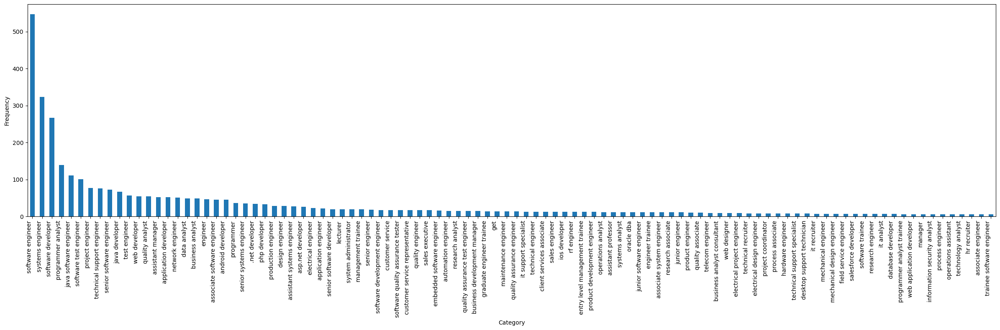

In [1043]:
single_var_discrete_univariate_analysis(data["Designation"])

- Now there are 398 categories in Designation column before treating there were 419 categories
- Most of candidates are software engineers

### Fixing JobCity Column

In [145]:
data["JobCity"] =data["JobCity"].str.lower()

In [146]:
data['JobCity'] = data['JobCity'].replace('-1', 'others')

In [147]:
data["JobCity"] =data["JobCity"].str.strip()

In [148]:
citychoices=['banglore','new delhi','hyderabad','indore','chennai','gurgaon','manesar','noida',
             'kolkata','pune','mohali','jhansi','bhubaneshwar','mumbai','rewari','gaziabad','bhiwadi',
             'mysore','jaipur','thane','maharajganj', 'thiruvananthapuram', 'punchkula','coimbatore', 
             'dhanbad', 'lucknow', 'trivandrum', 'gandhi nagar','unnao', 'daman and diu','nagpur',
             'bhagalpur', 'new delhi - jaisalmer', 'ahmedabad', 'kochi/cochin',
             'bankura','kanpur', 'vijayawada', 'kochi', 'beawar',
             'alwar', 'siliguri', 'raipur', 'bhopal', 'faridabad', 'jodhpur',
             'udaipur', 'muzaffarpur', 'bulandshahar', 'haridwar',
             'raigarh', 'visakhapatnam', 'jabalpur','aurangabad',
             'belgaum', 'dehradun', 'rudrapur', 'jamshedpur','dharamshala','hissar', 'ranchi', 'madurai',
             'chandigarh', 'australia', 'cheyyar', 'sonepat','pantnagar', 'jagdalpur', 'angul', 'baroda',
             'ariyalur', 'jowai', 'kochi/cochin ', 'neemrana', 'tirupathi','calicut', 'gandhinagar',
             'dubai', 'ahmednagar', 'nashik', 'bellary', 'ludhiana','gagret','gwalior',
             'chennai & mumbai', 'rajasthan', 'sonipat','bareli', 'hospete',
       'miryalaguda', 'dharuhera', 'meerut', 'ganjam', 'hubli', 'ncr',
       'agra', 'trichy', 'kudankulam ,tarapur', 'ongole', 'sambalpur',
       'pondicherry', 'bundi', 'sadulpur','am', 'bikaner', 'vadodara', 'india', 'asansol', 'tirunelvelli',
       'ernakulam', 'bilaspur', 'chandrapur', 'nanded', 'dharmapuri',
       'vandavasi', 'rohtak', 'patna', 'salem', 'nasikcity',
       'technopark,trivandrum','bharuch', 'tornagallu', 'jaspur',
       'burdwan', 'shimla','jammu', 'shahdol',
       'muvattupuzha', 'al jubail,saudi arabia', 'kalmar, sweden',
       'secunderabad','ratnagiri', 'jhajjar',
       'gulbarga', 'hyderabad(bhadurpally)', 'nalagarh',
       'jeddah saudi arabia', 'chennai, bangalore', 'jamnagar', 'gonda', 'orissa', 'kharagpur','joshimath', 'bathinda', 'johannesburg',
       'kala amb', 'karnal', 'london', 'kota','baddi hp',
       'nagari', 'mettur, tamil nadu', 'durgapur','surat',
       'kurnool', 'kolhapur', 'bhilai', 'bahadurgarh',
       'rayagada, odisha', 'kakinada', 'varanasi',  'nellore',
       'sahibabad', 'howrah', 'trichur', 'ambala', 'khopoli', 'keral',
       'roorkee', 'allahabad',  'jalandhar', 'vapi', 'pilani','ras al khaimah', 'bihar', 'singaruli', 'phagwara',
         'baripada', 'yamuna nagar', 'shahibabad',
       'sampla', 'guwahati', 'rourkela',  'vellore', 'dausa',
       'latur (maharashtra )', 'mainpuri', 'dammam', 'haldia', 'patiala', 'gorakhpur', 'ambala city',
       'karad', 'rajpura', 'haryana'  ]

In [149]:
data["JobCity"] =data["JobCity"].apply(lambda JobCity:correcting_spelling_errors(target_word=JobCity,choices=citychoices))

In [544]:
data["JobCity"]=data["JobCity"].apply(lambda x: "banglore" if x=="bengaluru" else x)

In [545]:
data["JobCity"]=data["JobCity"].apply(lambda x: "visakhapatnam" if x=="vizag" else x)

In [546]:
data["JobCity"]=data["JobCity"].apply(lambda x: "pondicherry" if x=="pondy" else x)

count                                                   3998
nunique                                                  197
unique     [banglore, indore, chennai, gurgaon, manesar, ...
Name: JobCity, dtype: object


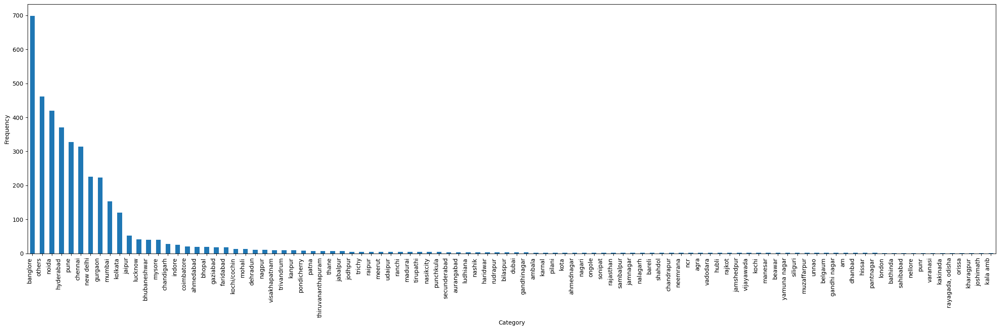

In [1044]:
single_var_discrete_univariate_analysis(data["JobCity"])

- After treating there are 197 categories in JobCity column before treating there were 339 categories. The graph represents the frequencies of Location of the job (city)
- Most of the candidates jobs are located in Banglore

### Fixing 10board Column

In [607]:
data["10board"] =data["10board"].str.strip()

In [608]:
board_dict={'state board': 'State board of secondary education', 'ssc': 'State board of secondary education',
                  'stateboard': 'State board of secondary education', 'board secondary education': 'State board of secondary education',
                  'board of secondary education': 'State board of secondary education', 'state board of secondary education( ssc)': 'State board of secondary education',
                  'state': 'State board of secondary education', 'board of ssc': 'State board of secondary education',
                  'secondary school cerfificate': 'State board of secondary education', 'secondary school of education': 'State board of secondary education',
                  'bse': 'State board of secondary education', 'bse(board of secondary education)': 'State board of secondary education',
                  'secondary state certificate': 'State board of secondary education', 'secondary school certificate': 'State board of secondary education',
                  'state board': 'State board of secondary education', 'board of secondaray education': 'State board of secondary education',
                  'board of secondary school education': 'State board of secondary education', 'secondary school education': 'State board of secondary education',
                  'state bord': 'State board of secondary education', 'ssc regular': 'State board of secondary education',
                  'board of secondary education': 'State board of secondary education', 'state board of secondary education': 'State board of secondary education',
                  'board of intermediate education': 'State board of secondary education','state board':'State board of secondary education',
            'board secondary education':'State board of secondary education','board of secondary education':'State board of secondary education',
           'board ofsecondary education,ap': 'State board of secondary education, andhra pradesh',
                  'board of secondary education,andhara pradesh': 'State board of secondary education, andhra pradesh',
                  'state board of secondary education,andhra pradesh': 'State board of secondary education, andhra pradesh',
                  'board of secondary education, andhra pradesh': 'State board of secondary education, andhra pradesh',
                  'board of secondary education,ap': 'State board of secondary education, andhra pradesh',
                  'board of secondary education,andhra pradesh': 'State board of secondary education, andhra pradesh',
                  'andhra pradesh board ssc': 'State board of secondary education, andhra pradesh',
                  'ssc board of andrapradesh': 'State board of secondary education, andhra pradesh',
                  'ssc-andhra pradesh': 'State board of secondary education, andhra pradesh',
                  'school secondary education, andhra pradesh': 'State board of secondary education, andhra pradesh',
                  'andhra pradesh state board': 'State board of secondary education, andhra pradesh',
                  'state board of secondary education, ap': 'State board of secondary education, andhra pradesh',
                  'apssc': 'State board of secondary education, andhra pradesh',
                  'ap state board': 'State board of secondary education, andhra pradesh',
                  'board of secondary education - andhra pradesh': 'State board of secondary education, andhra pradesh',
                  'ap state board for secondary education': 'State board of secondary education, andhra pradesh',
                  'board of ssc education andhra pradesh': 'State board of secondary education, andhra pradesh',
                  'state board of secondary education, andhra pradesh': 'State board of secondary education, andhra pradesh',
            'cbse': 'Central board of secondary education',
                 'cbse ': 'Central board of secondary education',
                 'cbsc': 'Central board of secondary education',
                 'cbse board': 'Central board of secondary education',
                 'cbse[gulf zone]': 'Central board of secondary education',
                 'central board of secondary education': 'Central board of secondary education',
                 'stjoseph of cluny matrhrsecschool,neyveli,cuddalore district': 'Central board of secondary education',
                 'cluny': 'Central board of secondary education',
                 'national public school': 'Central board of secondary education',
                 'jawahar navodaya vidyalaya': 'Central board of secondary education',
                 'central board of secondary education, new delhi': 'Central board of secondary education','karnataka education board (keeb)': 'Karnataka state education examination board',
                'karnataka state secondary education board': 'Karnataka state education examination board',
                'karnataka state board': 'Karnataka state education examination board',
                'karnataka secondary school of examination': 'Karnataka state education examination board',
                'karnataka secondory education board': 'Karnataka state education examination board',
                'karnataka board of secondary education': 'Karnataka state education examination board',
                'karnataka secondary eduction': 'Karnataka state education examination board',
                'karnataka secondary education board': 'Karnataka state education examination board',
                'karantaka secondary education and examination borad': 'Karnataka state education examination board',
                'karnataka secondary education examination board': 'Karnataka state education examination board',
                'state(karnataka board)': 'Karnataka state education examination board',
                'kseeb(karnataka secondary education examination board)': 'Karnataka state education examination board',
                'kseb': 'Karnataka state education examination board',
                'kseeb': 'Karnataka state education examination board',
                'state board of karnataka': 'Karnataka state education examination board',
                'ksseb': 'Karnataka state education examination board',
                'karnataka board of higher education': 'Karnataka state education examination board',
                'karnataka': 'Karnataka state education examination board',
                'karnataka education board': 'Karnataka state education examination board',
                'karnataka secondary board': 'Karnataka state education examination board',
                'karnataka board': 'Karnataka state education examination board',
                'ksseb(karnataka state board)': 'Karnataka state education examination board',
                'karnataka secondary education': 'Karnataka state education examination board',
                'karnataka state examination board': 'Karnataka state education examination board',
                'kea': 'Karnataka state education examination board',
                'karnataka state education examination board': 'Karnataka state education examination board',
           'kerala': 'Kerala state technical education',
                                         'education board of kerala': 'Kerala state technical education',
                                         'kerala state board': 'Kerala state technical education',
                                         'kerala university': 'Kerala state technical education',
                                         'ksbe': 'Kerala state technical education',
                                         'kerala state technical education': 'Kerala state technical education',
           'icse board': 'ICSE',
             'council for indian school certificate examination': 'ICSE',
             'cicse': 'ICSE',
             'icse board , new delhi': 'ICSE',
             'icse': 'ICSE',
           'u p board': 'Uttar pradesh board',
                             'upboard': 'Uttar pradesh board',
                             'up board': 'Uttar pradesh board',
                             'up board , allahabad': 'Uttar pradesh board',
                             'up baord': 'Uttar pradesh board',
                             'up': 'Uttar pradesh board',
                             'up(allahabad)': 'Uttar pradesh board',
                             'u p': 'Uttar pradesh board',
                             'up borad': 'Uttar pradesh board',
                             'uttar pradesh': 'Uttar pradesh board',
                             'bright way college, (up board)': 'Uttar pradesh board',
                             'up bord': 'Uttar pradesh board',
                             'up board allahabad': 'Uttar pradesh board',
                             'upbhsie': 'Uttar pradesh board',
                             'up bourd': 'Uttar pradesh board',
                             'up board,allahabad': 'Uttar pradesh board',
                             'board of high school and intermediate education uttarpradesh': 'Uttar pradesh board',
                             'up-board': 'Uttar pradesh board',
                             'uttar pradesh board': 'Uttar pradesh board',
           'gseb': 'Gujarat state board',
                            'gujarat board': 'Gujarat state board',
                            'ghseb': 'Gujarat state board',
                            'gsheb': 'Gujarat state board',
                            'gujarat state board': 'Gujarat state board',
           'matriculation': 'Matriculation board',
                            'maticulation': 'Matriculation board',
                            'metric': 'Matriculation board',
                            'matric board': 'Matriculation board',
                            'little jacky matric higher secondary school': 'Matriculation board',
                            'don bosco maatriculation school': 'Matriculation board',
                            'matric': 'Matriculation board',
                            'bharathi matriculation school': 'Matriculation board',
                            'matriculation board': 'Matriculation board',
           'bsc,orissa': 'Board of secondary education(bse) orissa',
                                                  'board of secendary education orissa': 'Board of secondary education(bse) orissa',
                                                  'bse, odisha': 'Board of secondary education(bse) orissa',
                                                  'board of secondary education orissa': 'Board of secondary education(bse) orissa',
                                                  'bse,orissa': 'Board of secondary education(bse) orissa',
                                                  'hse,orissa': 'Board of secondary education(bse) orissa',
                                                  'board of secondary education,orissa': 'Board of secondary education(bse) orissa',
                                                  'board of secondary education,odisha': 'Board of secondary education(bse) orissa',
                                                  'board of secondary education (bse) orissa': 'Board of secondary education(bse) orissa',
                                                  'bse,odisha': 'Board of secondary education(bse) orissa',
                                                  'board of secondary education(bse) orissa': 'Board of secondary education(bse) orissa',
           'board of school education harayana': 'Haryana board of school education,(hbse)',
                                                 'hbsc': 'Haryana board of school education,(hbse)',
                                                 'hbse': 'Haryana board of school education,(hbse)',
                                                 'haryana board of school education': 'Haryana board of school education,(hbse)',
                                                 'board of school education haryana': 'Haryana board of school education,(hbse)',
                                                 'haryana board of school education,(hbse)': 'Haryana board of school education,(hbse)',
           'state borad hp': 'Himachal pradesh board of school education',
                                                   'himachal pradesh board': 'Himachal pradesh board of school education',
                                                   'himachal pradesh board of school education': 'Himachal pradesh board of school education',
           
        'maharashtra': 'Maharashtra state board',
        'maharashtra state(latur board)': 'Maharashtra state board',
        'maharashtra sate board': 'Maharashtra state board',
        'maharashtra state board': 'Maharashtra state board',
        'maharashtra board': 'Maharashtra state board',
        'nagpur': 'Maharashtra state board',
        'latur': 'Maharashtra state board',
        'nagpur board': 'Maharashtra state board',
        'maharashtra state board of secondary and higher secondary education,pune': 'Maharashtra state board',
        'pune board': 'Maharashtra state board',
        'msbshse,pune': 'Maharashtra state board',
        'maharashtra state board,pune': 'Maharashtra state board',
        'sss pune': 'Maharashtra state board',
        'maharastra board': 'Maharashtra state board',
        'ssc maharashtra board': 'Maharashtra state board',
        'maharashtra satate board': 'Maharashtra state board',
        'maharashtra state board mumbai divisional board': 'Maharashtra state board',
        'maharashtra nasik board': 'Maharashtra state board',
        'nashik board': 'Maharashtra state board',
        'kolhapur divisional board, maharashtra': 'Maharashtra state board',
        'kolhapur': 'Maharashtra state board',
        'nagpur board,nagpur': 'Maharashtra state board',
        'pune': 'Maharashtra state board',
        'maharashtra state board,pune': 'Maharashtra state board',
        'maharashtra state board for ssc': 'Maharashtra state board',
        'latur board': 'Maharashtra state board',
        'nagpur divisional board': 'Maharashtra state board',
        'maharashtra state board of secondary and higher secondary education': 'Maharashtra state board',
        'maharashtra state boar of secondary and higher secondary education': 'Maharashtra state board',
        'nasik': 'Maharashtra state board',
        'maharashtra state board of secondary & higher secondary education': 'Maharashtra state board',
        'maharashtra board, pune': 'Maharashtra state board',
        'ms board': 'Maharashtra state board',
        'mumbai board': 'Maharashtra state board',
        'mhsbse': 'Maharashtra state board',
        'maharashtra state board': 'Maharashtra state board',
            'maharashtra state board pune':'Maharashtra state board',
           
        'jharkhand secondary examination board (ranchi)': 'Jharkhand secondary examination board,ranchi',
        'jharkhand secondary board': 'Jharkhand secondary examination board,ranchi',
        'state board (jac, ranchi)': 'Jharkhand secondary examination board,ranchi',
        'jharkhand secondary examination board,ranchi': 'Jharkhand secondary examination board,ranchi',
           
        'wbbse': 'West bengal board of secondary education',
        'west bengal board of secondary examination (wbbse)': 'West bengal board of secondary education',
        'wbbsce': 'West bengal board of secondary education',
        'west bengal board of secondary eucation': 'West bengal board of secondary education',
        'west bengal  board of secondary education': 'West bengal board of secondary education',
        'state board - west bengal board of secondary education : wbbse': 'West bengal board of secondary education',
        'west bengal board of secondary education': 'West bengal board of secondary education',
          'board of secondary education rajasthan': 'Board of secondary education,rajasthan(rbse)',
        'secondary board of rajasthan': 'Board of secondary education,rajasthan(rbse)',
        'board of secondary education, rajasthan': 'Board of secondary education,rajasthan(rbse)',
        'rajasthan board': 'Board of secondary education,rajasthan(rbse)',
        'rbse': 'Board of secondary education,rajasthan(rbse)',
        'rajasthan board ajmer': 'Board of secondary education,rajasthan(rbse)',
        'rajasthan board of secondary education': 'Board of secondary education,rajasthan(rbse)',
        'rbse,ajmer': 'Board of secondary education,rajasthan(rbse)',
        'secondary education board of rajasthan': 'Board of secondary education,rajasthan(rbse)',
        'rbse (state board)': 'Board of secondary education,rajasthan(rbse)',
        'board of secondary education,rajasthan(rbse)': 'Board of secondary education,rajasthan(rbse)',
           'jharkhand academic council': 'Jharkhand accademic council',
        'jharkhand secondary education board': 'Jharkhand accademic council',
        'jharkhand accademic council': 'Jharkhand accademic council',
        'jbse,jharkhand': 'Jharkhand accademic council',
        'jharkhand acedemic council': 'Jharkhand accademic council',
        'jseb': 'Jharkhand accademic council',
           'mp board bhopal': 'MP board',
        'mpboard': 'MP board',
        'mp board': 'MP board',
        'mp': 'MP board',
        'bsemp': 'MP board',
        'mp state board': 'MP board',
        'mpbse': 'MP board',
        'madhya pradesh board': 'MP board',
        'state boardmp board ': 'MP board',
        'mp-bse': 'MP board',
           'board of school education uttarakhand': 'Uttarakhand board',
        'uttrakhand board': 'Uttarakhand board',
        'uttarakhand board': 'Uttarakhand board',
           'tamilnadu state board': 'Tamilnadu matriculation board',
        'tamil nadu state': 'Tamilnadu matriculation board',
        'tn state board': 'Tamilnadu matriculation board',
        'tamilnadu matriculation board': 'Tamilnadu matriculation board',
        'stjosephs girls higher sec school,dindigul': 'Tamilnadu matriculation board',
           
        'bihar board': 'Bihar examination board',
        'bihar examination board, patna': 'Bihar examination board',
        'bseb,patna': 'Bihar examination board',
        'bseb': 'Bihar examination board',
        'bsepatna': 'Bihar examination board',
        'bihar': 'Bihar examination board',
        'bihar secondary education board,patna': 'Bihar examination board',
        'bseb patna': 'Bihar examination board',
        'bseb, patna': 'Bihar examination board',
        'biharboard': 'Bihar examination board',
        'bihar school examination board': 'Bihar examination board',
        'bihar school examination board patna': 'Bihar examination board',
        'bseb ,patna': 'Bihar examination board',
          'uttaranchal shiksha avam pariksha parishad': 'Uttaranchal state board',
        'uttranchal board': 'Uttaranchal state board',
        'uttaranchal state board': 'Uttaranchal state board',
            'j & k bord': 'Jammu and kashmir State Board of School Education',
        'jkbose': 'Jammu and kashmir State Board of School Education',
        'j&k state board of school education': 'Jammu and kashmir State Board of School Education',
        'Jammu and Kashmir State Board of School Education': 'Jammu and kashmir State Board of School Education',
            'cgbse raipur': 'CGBSE',
        'cgbse': 'CGBSE',
            'karnataka sslc board bangalore': 'SSLC',
        'sslc': 'SSLC',
        'sslc board': 'SSLC',
        'sslc,karnataka': 'SSLC',
            'punjab school education board, mohali': 'punjab school education board',
        'pseb': 'punjab school education board',
            'hse,board': 'HSE board',
        'hsc': 'HSE board',
        'hse': 'HSE board',
        'hsce': 'HSE board',
            'seba(assam)': 'Board of Secondary Education Assam',
        'seba': 'Board of Secondary Education Assam',
            'aisse': 'AISSEE',
            '0':'other' ,
            'delhi board': 'Delhi board',
        'delhi public school': 'Delhi board',
    }

In [609]:
data['10board']=data['10board'].replace(board_dict)

In [611]:
data['10board'].nunique()

49

<Axes: >

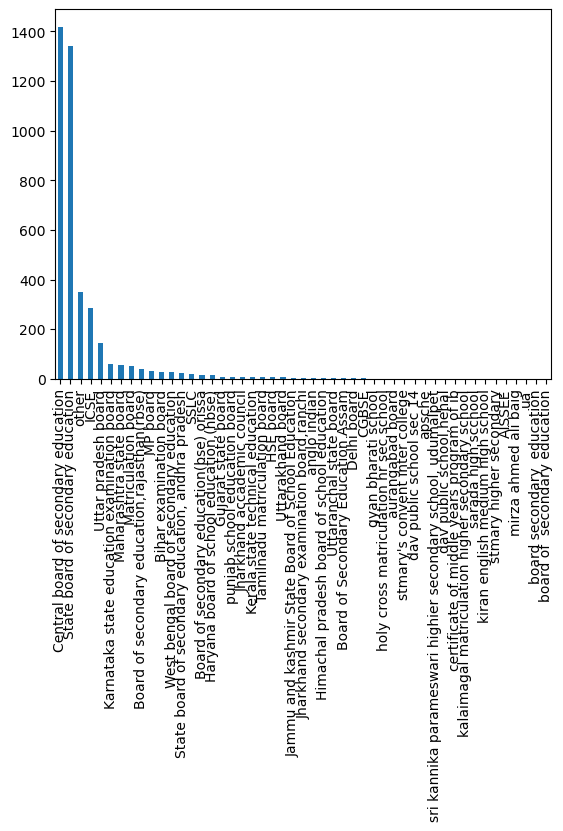

In [1045]:
data['10board'].value_counts().head(100).plot(kind='bar')

count                                                   3998
nunique                                                   49
unique     [State board of secondary education, andhra pr...
Name: 10board, dtype: object


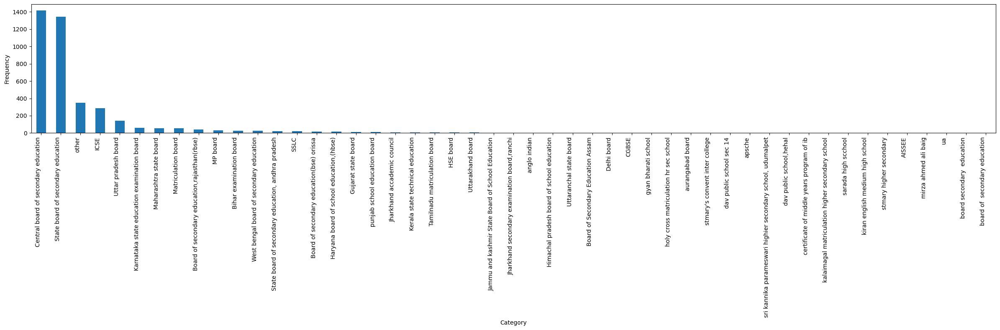

In [1046]:
single_var_discrete_univariate_analysis(data["10board"])

- After treating the 10board coulumn the categories reduced to 49 categories from 275 categories
- Most of the candidates are from Central board of secondary education

### Fixing 12board Column

In [620]:
b_dict={
    'karnataka state board': 'Karnataka Pre-University Education',
    'karnataka pre university board': 'Karnataka Pre-University Education',
    'dept of pre-university education': 'Karnataka Pre-University Education',
    'p u board, karnataka': 'Karnataka Pre-University Education',
    'pre university': 'Karnataka Pre-University Education',
    'karnataka pu board': 'Karnataka Pre-University Education',
    'pu board': 'Karnataka Pre-University Education',
    'pre university board': 'Karnataka Pre-University Education',
    'pu board karnataka': 'Karnataka Pre-University Education',
    'karnataka board of university': 'Karnataka Pre-University Education',
    'u p board': 'Karnataka Pre-University Education',
    'pue': 'Karnataka Pre-University Education',
    'department of pre-university education': 'Karnataka Pre-University Education',
    'preuniversity board(karnataka)': 'Karnataka Pre-University Education',
    'department of pre-university eduction': 'Karnataka Pre-University Education',
    'pre-university': 'Karnataka Pre-University Education',
    'pu': 'Karnataka Pre-University Education',
    'department of pre-university education(government of karnataka)': 'Karnataka Pre-University Education',
    'pre-university board': 'Karnataka Pre-University Education',
    'pu board ,karnataka': 'Karnataka Pre-University Education',
    'department of pre-university education, bangalore': 'Karnataka Pre-University Education',
    'govt of karnataka department of pre-university education': 'Karnataka Pre-University Education',
    'pre university board of karnataka': 'Karnataka Pre-University Education',
    'karanataka secondary board': 'Karnataka Pre-University Education',
    'karnataka pre-university board': 'Karnataka Pre-University Education',
    'karnataka pre unversity board': 'Karnataka Pre-University Education',
    'department of pre university education': 'Karnataka Pre-University Education',
    'pu  board karnataka': 'Karnataka Pre-University Education',
    'pre university board, karnataka': 'Karnataka Pre-University Education',
    'karnataka pre-university': 'Karnataka Pre-University Education',
    'karnataka state pre- university board': 'Karnataka Pre-University Education',
    'karnataka pu': 'Karnataka Pre-University Education',
    'puboard': 'Karnataka Pre-University Education',
    'dpue': 'Karnataka Pre-University Education',
    'karnataka secondary education board': 'KSEAB',
    'karnataka education board': 'KSEAB',
    'state board of karnataka': 'KSEAB',
    'karnataka board': 'KSEAB',
    'karnatak pu board': 'KSEAB',
    'karnataka state': 'KSEAB',
    'karnataka secondary education': 'KSEAB',
    'karnataka board secondary education': 'KSEAB',
    'karnataka state examination board': 'KSEAB',
    'state  board of intermediate education, andhra pradesh': 'State board of intermediate education, Andhra pradesh',
    'intermediate board of andhra pardesh': 'State board of intermediate education, Andhra pradesh',
    'andhra board': 'State board of intermediate education, Andhra pradesh',
    'board of intermediate education,andhra pradesh': 'State board of intermediate education, Andhra pradesh',
    'intermediate board of education,andhra pradesh': 'State board of intermediate education, Andhra pradesh',
    'board of intermediate education,andra pradesh': 'State board of intermediate education, Andhra pradesh',
    'board of intermediate ap': 'State board of intermediate education, Andhra pradesh',
    'andhpradesh board of intermediate education': 'State board of intermediate education, Andhra pradesh',
    'board of intermediate education, andhra pradesh': 'State board of intermediate education, Andhra pradesh',
    'board of intermediate education:ap,hyderabad': 'State board of intermediate education, Andhra pradesh',
    'apbsc': 'State board of intermediate education, Andhra pradesh',
    'board of intermediate education,ap': 'State board of intermediate education, Andhra pradesh',
    'ap board': 'State board of intermediate education, Andhra pradesh',
    'andhra pradesh state board': 'State board of intermediate education, Andhra pradesh',
    'andhra pradesh board of secondary education': 'State board of intermediate education, Andhra pradesh',
    'board of intermediate education, ap': 'State board of intermediate education, Andhra pradesh',
    'andhra pradesh': 'State board of intermediate education, Andhra pradesh',
    'ap intermediate board': 'State board of intermediate education, Andhra pradesh',
    'board of intmediate education ap': 'State board of intermediate education, Andhra pradesh',
    'ap board for intermediate education': 'State board of intermediate education, Andhra pradesh',
    'board of intermediate,ap': 'State board of intermediate education, Andhra pradesh',
    'board fo intermediate education, ap': 'State board of intermediate education, Andhra pradesh',
    'apbie': 'State board of intermediate education, Andhra pradesh',
    'board of intermidiate education,ap': 'State board of intermediate education, Andhra pradesh',
    'board of intrmediate education,ap': 'State board of intermediate education, Andhra pradesh',
    'apsb': 'State board of intermediate education, Andhra pradesh',
    'bieap': 'State board of intermediate education, Andhra pradesh',
    'bie': 'State board of intermediate education, Andhra pradesh',
    'state board': 'State board of intermediate education',
    'ssc': 'State board of intermediate education',
    'borad of intermediate': 'State board of intermediate education',
    'board of intermediate': 'State board of intermediate education',
    'board of intermediate education': 'State board of intermediate education',
    'state': 'State board of intermediate education',
    'intermediate state board': 'State board of intermediate education',
    'stateboard': 'State board of intermediate education',
    'baord of intermediate education': 'State board of intermediate education',
    'intermediate': 'State board of intermediate education',
    'staae board': 'State board of intermediate education',
    ' board of intermediate': 'State board of intermediate education',
    'board of secondary education': 'State board of intermediate education',
    'intermediate board examination': 'State board of intermediate education',
    'intermediate board': 'State board of intermediate education',
    'board of secondary school of education': 'State board of intermediate education',
    'board of intermediate education,hyderabad': 'State board of intermediate education',
    'intermidiate': 'State board of intermediate education',
    'state broad': 'State board of intermediate education',
    'board of intermidiate': 'State board of intermediate education',
    'state board ': 'State board of intermediate education',
    'board of intermediate(bie)': 'State board of intermediate education',
    'board of intermidiate examination': 'State board of intermediate education',
    'state bord': 'State board of intermediate education',
    'board of intermeadiate education': 'State board of intermediate education',
    'intermediate board of education': 'State board of intermediate education',
    'boardofintermediate': 'State board of intermediate education',
    'intermedite': 'State board of intermediate education',
    'mpc': 'State board of intermediate education',
    'intermideate': 'State board of intermediate education',
    'sri chaitanya junior kalasala': 'State board of intermediate education',
    'state syllabus': 'State board of intermediate education',
    'narayana junior college': 'State board of intermediate education',
    'cbse': 'CBSE',
    'central board of secondary education': 'CBSE',
    'cbsc': 'CBSE',
    'cbse board': 'CBSE',
    'cbse,new delhi': 'CBSE',
    'cbese': 'CBSE',
    'central board of secondary education, new delhi': 'CBSE',
    'up': 'Uttar Pradesh State Board',
    'up board': 'Uttar Pradesh State Board',
    ' upboard': 'Uttar Pradesh State Board',
    'up board': 'Uttar Pradesh State Board',
    'uttar pradesh board': 'Uttar Pradesh State Board',
    'upboard': 'Uttar Pradesh State Board',
    'up(allahabad)': 'Uttar Pradesh State Board',
    'up baord': 'Uttar Pradesh State Board',
    'upbhsie': 'Uttar Pradesh State Board',
    'bright way college, (up board)': 'Uttar Pradesh State Board',
    'uttar pradesh': 'Uttar Pradesh State Board',
    'up board , allahabad': 'Uttar Pradesh State Board',
    'u p': 'Uttar Pradesh State Board',
    'up bord': 'Uttar Pradesh State Board',
    'up-board': 'Uttar Pradesh State Board',
    'up board allahabad': 'Uttar Pradesh State Board',
    'up board,allahabad': 'Uttar Pradesh State Board',
    'board of high school and intermediate education uttarpradesh': 'Uttar Pradesh State Board',
    'up bourd': 'Uttar Pradesh State Board',
    'uo board': 'Uttar Pradesh State Board',
    'west bengal state council of technical education': 'WBSCTE',
    'wbscte': 'WBSCTE',
    'west bengal council of higher secondary education': 'WBCHSE',
    'wbchse': 'WBCHSE',
    'wbbhse': 'WBCHSE',
    'west bengal board of higher secondary education': 'WBCHSE',
    'west bengal council of higher secondary examination (wbchse)': 'WBCHSE',
    'west bengal council of higher secondary eucation': 'WBCHSE',
    'state board - west bengal council of higher secondary education : wbchse': 'WBCHSE',
    'maharashtra state board': 'Maharashtra state board',
    'Maharashtra hsc': 'Maharashtra state board',
    'hsc pune': 'Maharashtra state board',
    'ms board': 'Maharashtra state board',
    'maharashtra': 'Maharashtra state board',
    'nagpur': 'Maharashtra state board',
    'nagpur board': 'Maharashtra state board',
    'kolhapur divisional board, maharashtra': 'Maharashtra state board',
    'maharashtra satate board': 'Maharashtra state board',
    'maharashtra state board for hsc': 'Maharashtra state board',
    'maharashtra board': 'Maharashtra state board',
    'maharashtra board, pune': 'Maharashtra state board',
    'maharashtra state(latur board)': 'Maharashtra state board',
    'msbte pune': 'Maharashtra state board',
    'pune board': 'Maharashtra state board',
    'latur board': 'Maharashtra state board',
    'latur': 'Maharashtra state board',
    'maharashtra nasik board': 'Maharashtra state board',
    'hsc maharashtra board': 'Maharashtra state board',
    'nagpur board,nagpur': 'Maharashtra state board',
    'maharashtra state board mumbai divisional board': 'Maharashtra state board',
    'kolhapur': 'Maharashtra state board',
    'maharashtra state boar of secondary and higher secondary education': 'Maharashtra state board',
    'msbshse,pune': 'Maharashtra state board',
    'maharashtra state board of secondary & higher secondary education': 'Maharashtra state board',
    'nasik': 'Maharashtra state board',
    'nashik board': 'Maharashtra state board',
    'aurangabad board': 'Maharashtra state board',
    'amravati divisional board': 'Maharashtra state board',
    'nagpur divisional board': 'Maharashtra state board',
    'hsc': 'HSC',
    'hisher seconadry examination(state board)': 'HSC',
    'higher secondary': 'HSC',
    'higher secondary state certificate': 'HSC',
    'hse': 'HSC',
    'higher secondary education': 'HSC',
        'chse(concil of higher secondary education)': 'CHSE',
        'chsc': 'CHSE',
        'chse,orissa': 'CHSE',
        'chse, odisha': 'CHSE',
        'chse,odisha': 'CHSE',
        'chse': 'CHSE',
        'board of higher secondary orissa': 'CHSE',
        'certificate for higher secondary education (chse)orissa': 'CHSE',
        'isc board': 'ISC',
        'isc': 'ISC',
        'isc board , new delhi': 'ISC',
        'cicse': 'ISC',
        'icse': 'ISC',
        'isce': 'ISC',
        'council for indian school certificate examination': 'ISC',
        'rbse': 'RBSE',
        'board of secondary education rajasthan': 'RBSE',
        'rajasthan board': 'RBSE',
        'board of secondary education, rajasthan': 'RBSE',
        'board of secondary education,rajasthan(rbse)': 'RBSE',
        'rajasthan board ajmer': 'RBSE',
        'secondary board of rajasthan': 'RBSE',
        'rajasthan board of secondary education': 'RBSE',
        'rbse (state board)': 'RBSE',
        'secnior secondary education board of rajasthan': 'RBSE',
        'mp board': 'MPBSE',
        'mpboard': 'MPBSE',
        'mp': 'MPBSE',
        'mp-bse': 'MPBSE',
        'mpbse': 'MPBSE',
        'mp board bhopal': 'MPBSE',
        'madhya pradesh board': 'MPBSE',
        'bsemp': 'MPBSE',
        'madhya pradesh open school': 'MPBSE',
        'j & k board': 'J&K board',
        'jkbose': 'J&K board',
        'j&k state board of school education': 'J&K board',
        'hbse': 'BSEH',
        'state board of technical education harayana': 'BSEH',
        'haryana state board of technical education chandigarh': 'BSEH',
        'board of school education harayana': 'BSEH',
        'hbsc': 'BSEH',
        'tamilnadu stateboard': 'TN Board',
        'tamilnadu higher secondary education board': 'TN Board',
        'tamil nadu state board': 'TN Board',
        'tamilnadu state board': 'TN Board',
        'tn state board': 'TN Board',
        'state board - tamilnadu': 'TN Board',
        'tamil nadu state': 'TN Board',
        'hslc (tamil nadu state board)': 'TN Board',
        'stateboard/tamil nadu': 'TN Board',
        'jharkhand accademic council': 'JAC',
        'jharkhand acamedic council (ranchi)': 'JAC',
        'jharkhand academic council': 'JAC',
        'jharkhand board': 'JAC',
        'state board (jac, ranchi)': 'JAC',
        'jharkhand acedemic council': 'JAC',
        'kerala': 'Kerala DHSE',
        'kerala state board': 'Kerala DHSE',
        'board of higher secondary examination, kerala': 'Kerala DHSE',
        'kerala state hse board': 'Kerala DHSE',
        'bihar board': 'BSEB',
        'bihar school examination board patna': 'BSEB',
        'bihar': 'BSEB',
        'bihar intermediate education council, patna': 'BSEB',
        'biec-patna': 'BSEB',
        'bseb, patna': 'BSEB',
        'bseb': 'BSEB',
        'bciec,patna': 'BSEB',
        'bihar intermediate education council': 'BSEB',
        'intermediate council patna': 'BSEB',
        'biec,patna': 'BSEB',
        'biec patna': 'BSEB',
        'bice': 'BSEB',
        'biec, patna': 'BSEB',
        'biec': 'BSEB',
        'uttarakhand board': 'UBSE',
        'uttrakhand board': 'UBSE',
        'board of school education uttarakhand': 'UBSE',
        'uttaranchal state board': 'UBSE',
        'uttaranchal shiksha avam pariksha parishad': 'UBSE',
        'uttranchal board': 'UBSE',
        'pseb': 'PSEB',
        'himachal pradesh board of school education': 'HPBOSE',
        'himachal pradesh board': 'HPBOSE',
       'ahsec': 'AHSEC',
        'punjab state board of technical education & industrial training': 'PSBTE & IT',
        'punjab state board of technical education & industrial training, chandigarh': 'PSBTE & IT',
        'psbte': 'PSBTE & IT',
        'board of technicaleducation ,delhi': 'BTE delhi',
        'board of technical education': 'BTE delhi',
        'bte,delhi': 'BTE delhi',
        'state board of technical eduction panchkula': 'HSTES',
        'technical board, punchkula': 'HSTES',
        'state board of technical education and training': 'SBTET',
        'sbtet': 'SBTET',
        'bte up': 'BTEUP',
        'bteup': 'BTEUP',
        'scte&vt': 'SCTE&VT',
        'scte & vt (diploma)': 'SCTE&VT',
        'scte vt orissa': 'SCTE&VT',
        'scte and vt ,orissa': 'SCTE&VT',
        'department of technical education, bangalore': 'DTE Karnataka',
        'directorate of technical education,banglore': 'DTE Karnataka',
        'dte': 'DTE',
        'department of technical education': 'DTE',
        'cgbse': 'CGBSE',
        'cgbse raipur': 'CGBSE',
        'matriculation': 'Matriculation',
        'matric board': 'Matriculation',
        'msbte (diploma in computer technology)': 'MSBTE',
        'msbte': 'MSBTE',
        'diploma ( maharashtra state board of technical education)': 'MSBTE',
        'gsheb': 'GSEB',
        'gseb': 'GSEB',
        'ghseb': 'GSEB',
        'gseb/technical education board': 'GSEB',
        'gujarat board': 'GSEB',
        'gshseb': 'GSEB',
        '0':'other'
}

In [627]:
data['12board']=data['12board'].replace(b_dict)

In [629]:
data['12board'].nunique()

83

<Axes: >

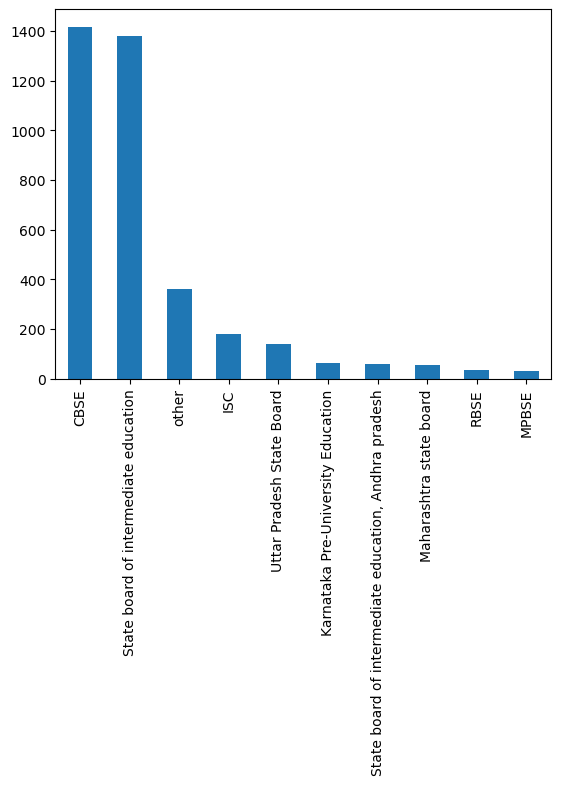

In [714]:
data['12board'].value_counts().head(10).plot(kind='bar')

count                                                   3998
nunique                                                   83
unique     [State board of intermediate education, Andhra...
Name: 12board, dtype: object


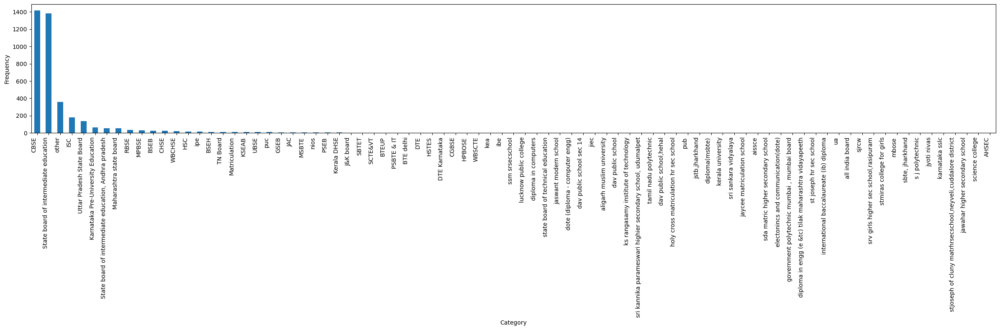

In [1047]:
single_var_discrete_univariate_analysis(data["12board"])

- After treating the 12board coulumn the categories reduced to 83 categories from 340 categories
- most of the candidates are from CBSE

### Fixing Specialization Column

In [211]:
data['Specialization']=data['Specialization'].str.replace("electronics & instrumentation eng","electronics and instrumentation engineering")

In [209]:
data['Specialization']=data['Specialization'].str.replace("computer science & engineering","computer science")

In [212]:
data['Specialization']=data['Specialization'].str.replace("electronics engineering","electronics")

count                                                   3998
nunique                                                   43
unique     [computer engineering, electronics and communi...
Name: Specialization, dtype: object


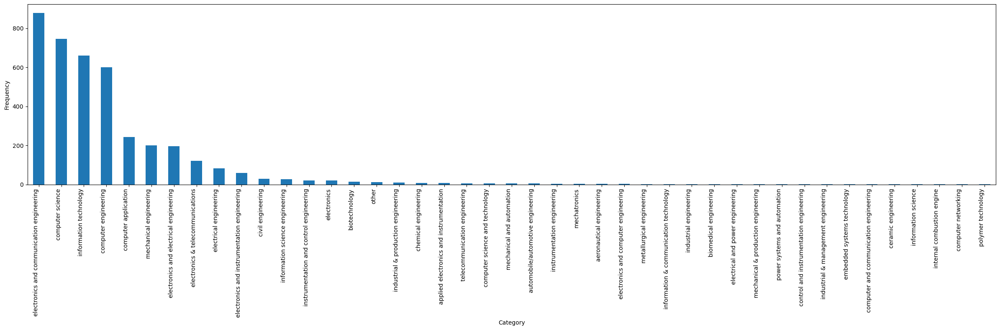

In [1048]:
single_var_discrete_univariate_analysis(data['Specialization'])

- After treating the Specialization coulumn the categories reduced to 43 categories
- Most of the candidates Specialization is electronics and communication engineering

### Fixing GraduationYear Column

In [233]:
data[data['GraduationYear'] == 0][:][['DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB', '10board',
       '12graduation', '12board', 'CollegeTier', 'Degree', 'Specialization',
       'CollegeCityTier', 'CollegeState', 'GraduationYear']]

,DOJ,DOL,Designation,JobCity,Gender,DOB,10board,12graduation,12board,CollegeTier,Degree,Specialization,CollegeCityTier,CollegeState,GraduationYear
2664,7/1/14 0:00,7/1/15 0:00,systems engineer,chandigarh,m,12/17/91 0:00,cbse,2010,cbse,2,B.Tech/B.E.,mechanical engineering,0,Uttar Pradesh,0


- Here 12graduation year is 2010, as he is a mechanical engineering it may took 4 years to complete his engineering. so, his graduation year will become 2014

In [259]:
data["GraduationYear"]=data["GraduationYear"].apply(lambda x: 2014 if x==0 else x)

count                                                   3998
nunique                                                   10
unique     [2011, 2012, 2014, 2016, 2013, 2010, 2015, 200...
Name: GraduationYear, dtype: object


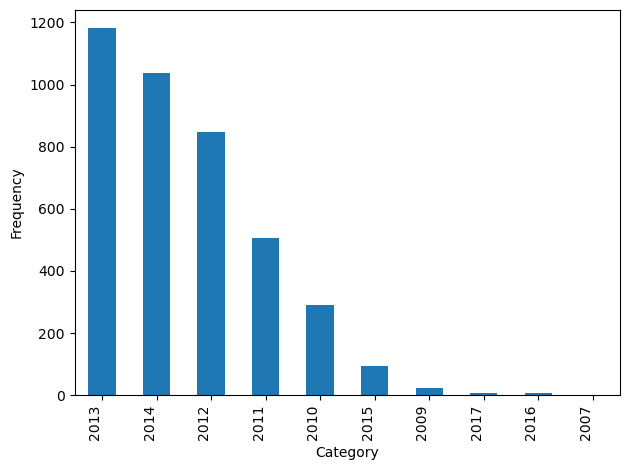

In [710]:
single_var_discrete_univariate_analysis(data['GraduationYear'])

- Most of the cadidates graduated in the year 2013

### Univariate analysis on Numerical varibales
- Continuous Numerical variable columns :"Salary","10percentage","12percentage","collegeGPA","English","Logical","Quant",       "Domain","ComputerProgramming","ElectronicsAndSemicon","ComputerScience","MechanicalEngg","ElectricalEngg","TelecomEngg", "CivilEngg","conscientiousness","agreeableness","extraversion","neuroticism","openess_to_experience"

In [64]:
numerical_data.columns

Index(['Salary', '10percentage', '12percentage', 'collegeGPA', 'English',
       'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
       'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

In [43]:
pd.set_option('display.max_rows', 70000)

In [352]:
import scipy.stats as stats
def numerical_univariate_analysis(numerical_data):
    for col_name in numerical_data:
        print("*"*10, col_name, "*"*10)
        print(numerical_data[col_name].agg(['min', 'max', 'mean', 'median', 'std',"skew","kurt"]))
        fig, axs = plt.subplots(2, 2, figsize=(14, 8))

        sns.histplot(numerical_data[col_name], kde=True, ax=axs[0, 0])
        axs[0,0].set_title('Histogram with KDE')

        sns.boxplot(numerical_data[col_name], ax=axs[0, 1])
        axs[0,1].set_title('Box Plot')
        
        stats.probplot(numerical_data[col_name], dist="norm", plot=axs[1, 0])
        axs[1, 0].set_title('QQ Plot')
        
        axs[1, 1].axis('off')

        plt.tight_layout()

        plt.show()


In [448]:
def single_col_numerical_univariate_analysis(col_name):
    print(col_name.agg(['min', 'max', 'mean', 'median', 'std',"skew","kurt"]))
    fig, axs = plt.subplots(2, 2, figsize=(14, 8))

    sns.histplot(col_name, kde=True, ax=axs[0, 0])
    axs[0,0].set_title('Histogram with KDE')

    sns.boxplot(col_name, ax=axs[0, 1])
    axs[0,1].set_title('Box Plot')

    stats.probplot(col_name, dist="norm", plot=axs[1, 0])
    axs[1, 0].set_title('QQ Plot')

    axs[1, 1].axis('off')

    plt.tight_layout()

    plt.show()


********** Salary **********
min       3.500000e+04
max       4.000000e+06
mean      3.076998e+05
median    3.000000e+05
std       2.127375e+05
skew      6.451081e+00
kurt      8.093000e+01
Name: Salary, dtype: float64


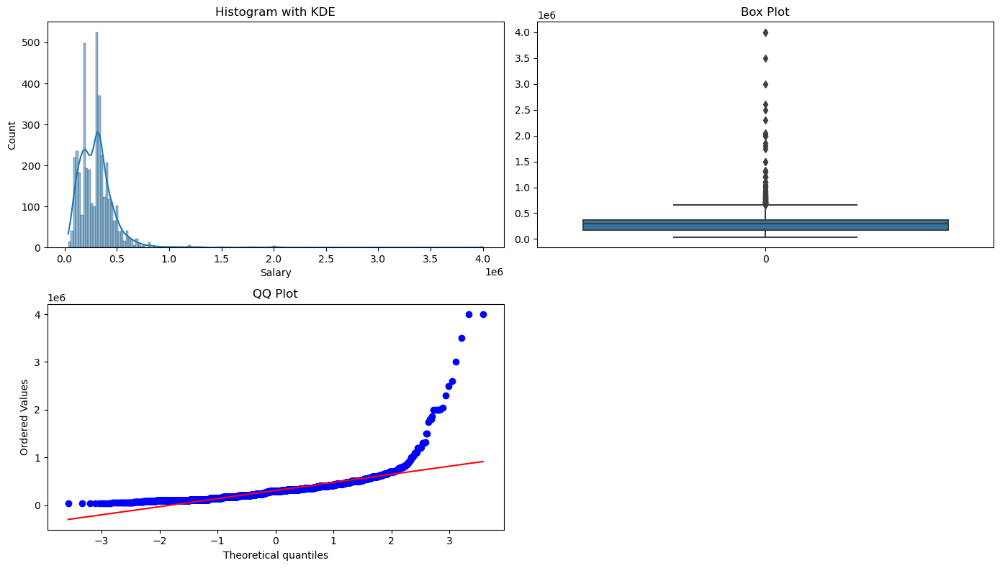

********** 10percentage **********
min       43.000000
max       97.760000
mean      77.925443
median    79.150000
std        9.850162
skew      -0.591019
kurt      -0.110284
Name: 10percentage, dtype: float64


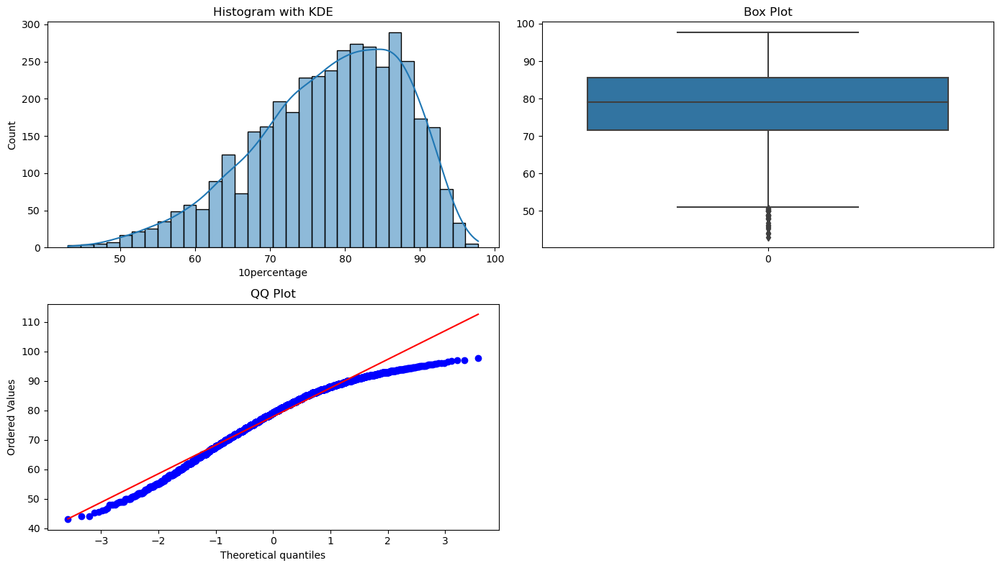

********** 12percentage **********
min       40.000000
max       98.700000
mean      74.466366
median    74.400000
std       10.999933
skew      -0.032607
kurt      -0.630737
Name: 12percentage, dtype: float64


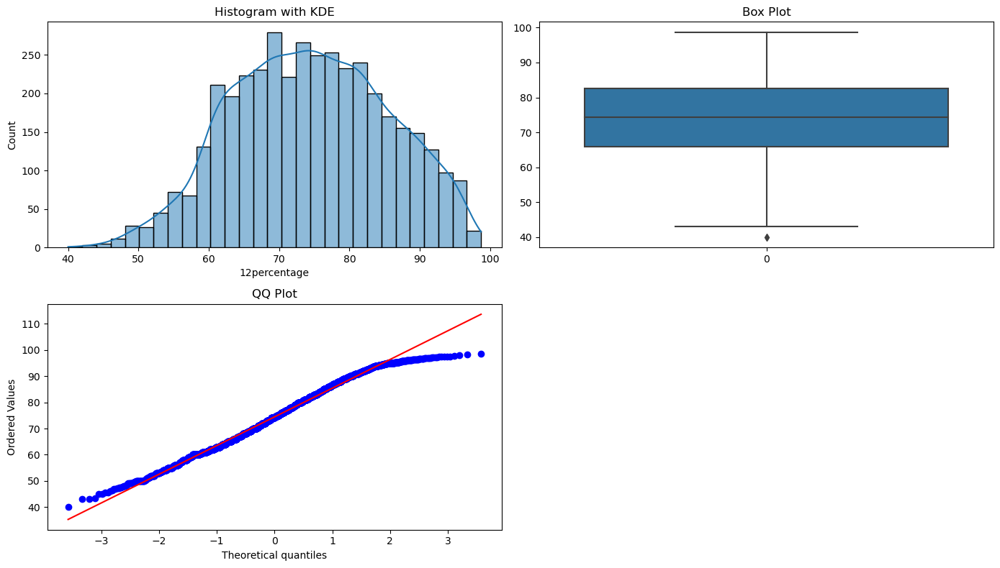

********** collegeGPA **********
min        6.450000
max       99.930000
mean      71.486171
median    71.720000
std        8.167338
skew      -1.249209
kurt      10.234244
Name: collegeGPA, dtype: float64


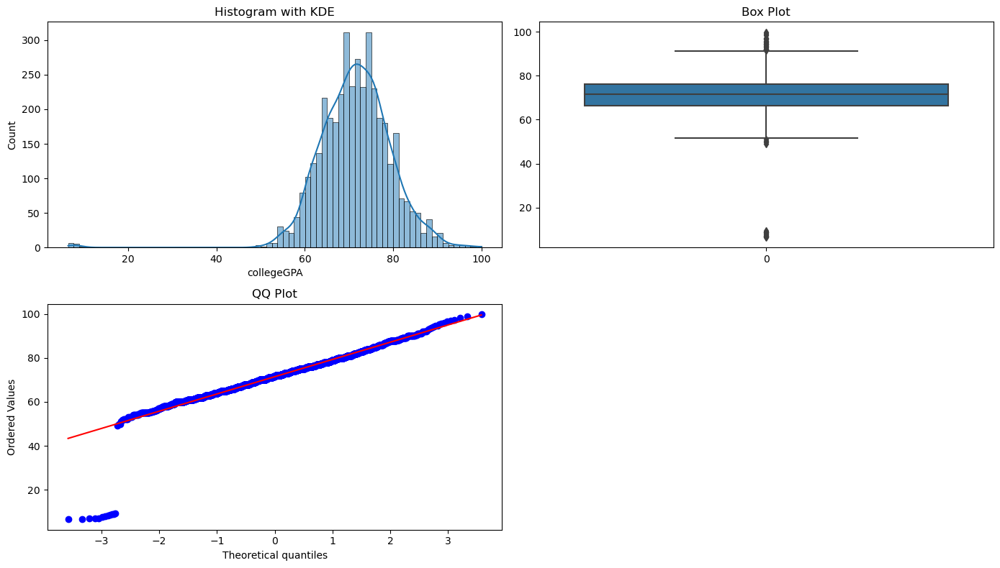

********** English **********
min       180.000000
max       875.000000
mean      501.649075
median    500.000000
std       104.940021
skew        0.191997
kurt       -0.254133
Name: English, dtype: float64


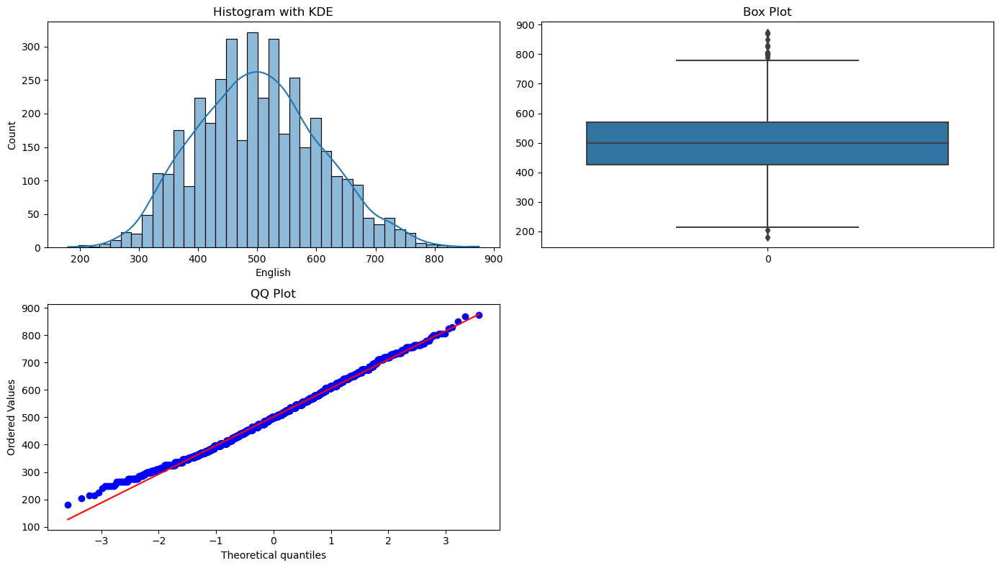

********** Logical **********
min       195.000000
max       795.000000
mean      501.598799
median    505.000000
std        86.783297
skew       -0.216602
kurt       -0.224761
Name: Logical, dtype: float64


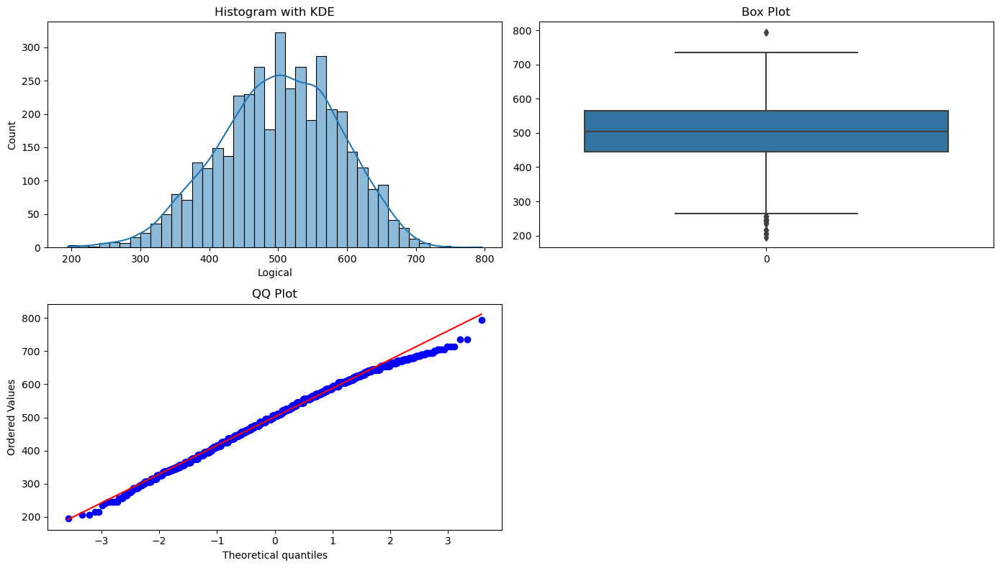

********** Quant **********
min       120.000000
max       900.000000
mean      513.378189
median    515.000000
std       122.302332
skew       -0.019399
kurt       -0.102472
Name: Quant, dtype: float64


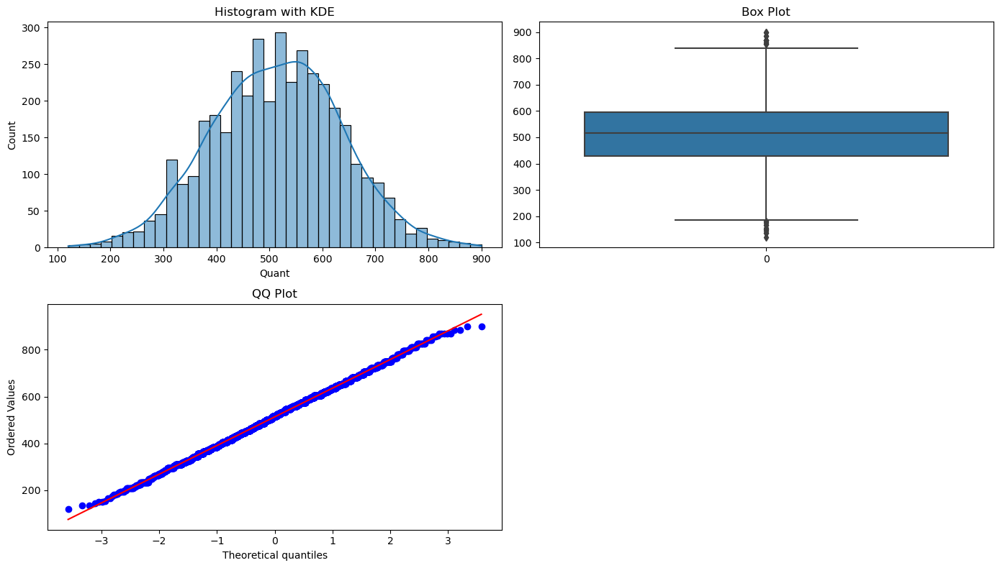

********** Domain **********
min      -1.000000
max       0.999910
mean      0.510490
median    0.622643
std       0.468671
skew     -1.922146
kurt      3.895951
Name: Domain, dtype: float64


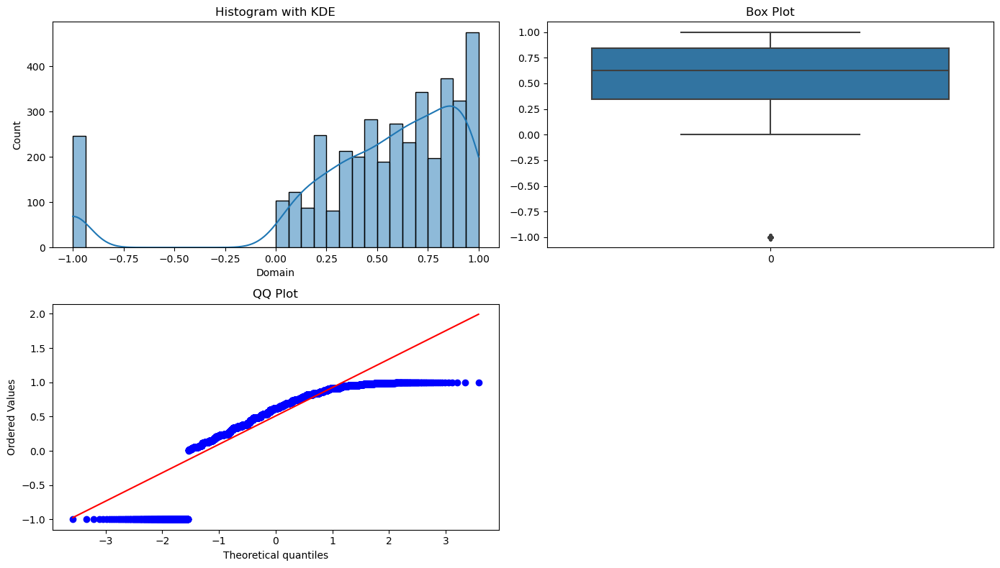

********** ComputerProgramming **********
min        -1.000000
max       840.000000
mean      353.102801
median    415.000000
std       205.355519
skew       -0.778106
kurt       -0.666352
Name: ComputerProgramming, dtype: float64


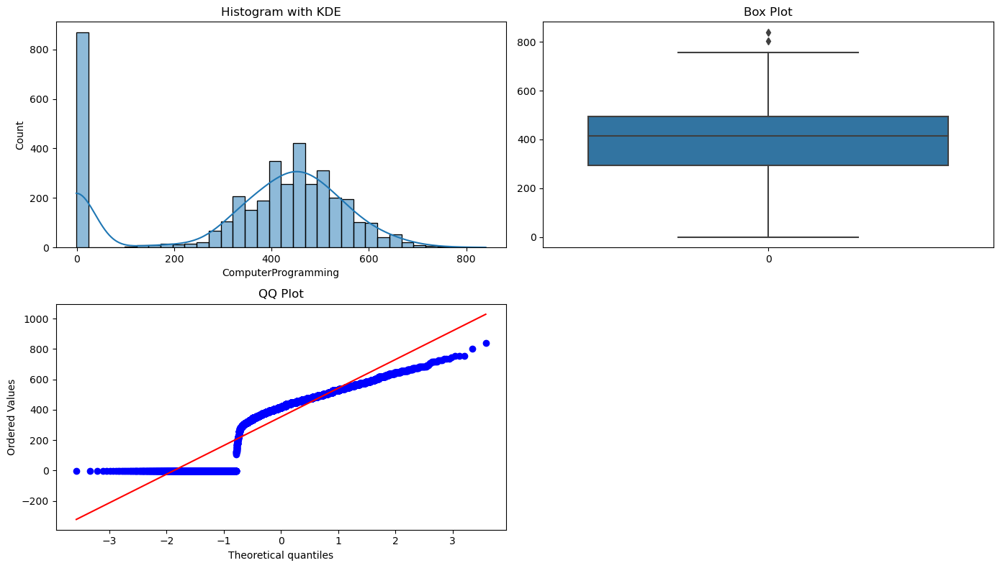

********** ElectronicsAndSemicon **********
min        -1.000000
max       612.000000
mean       95.328414
median     -1.000000
std       158.241218
skew        1.195975
kurt       -0.210374
Name: ElectronicsAndSemicon, dtype: float64


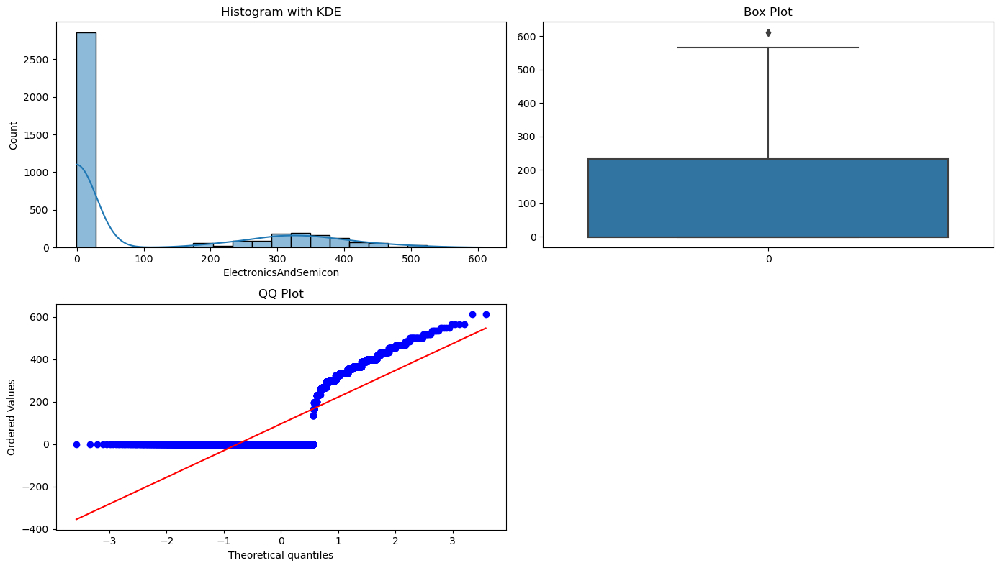

********** ComputerScience **********
min        -1.000000
max       715.000000
mean       90.742371
median     -1.000000
std       175.273083
skew        1.529521
kurt        0.692641
Name: ComputerScience, dtype: float64


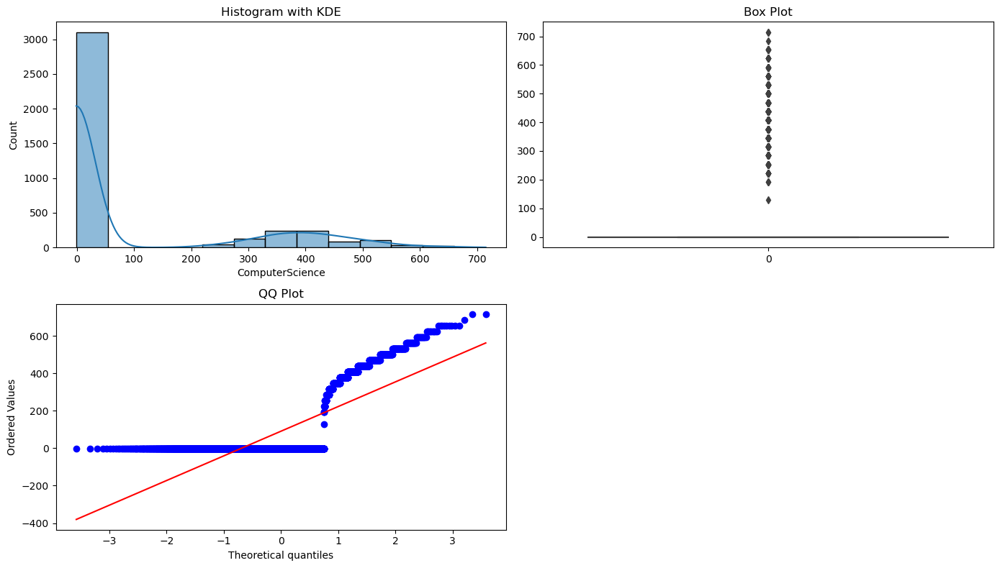

********** MechanicalEngg **********
min        -1.000000
max       623.000000
mean       22.974737
median     -1.000000
std        98.123311
skew        4.029563
kurt       15.018957
Name: MechanicalEngg, dtype: float64


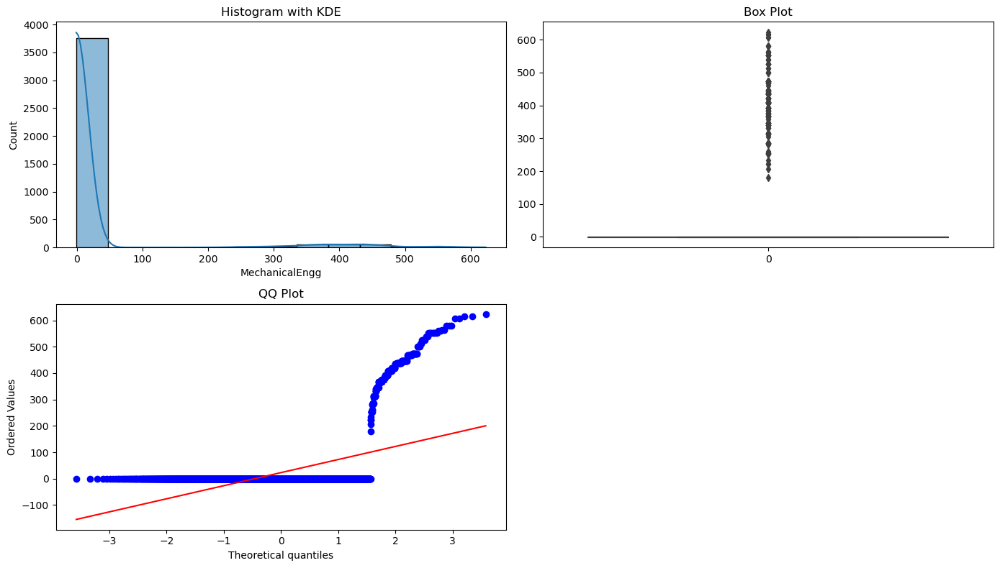

********** ElectricalEngg **********
min        -1.000000
max       676.000000
mean       16.478739
median     -1.000000
std        87.585634
skew        5.060407
kurt       24.878194
Name: ElectricalEngg, dtype: float64


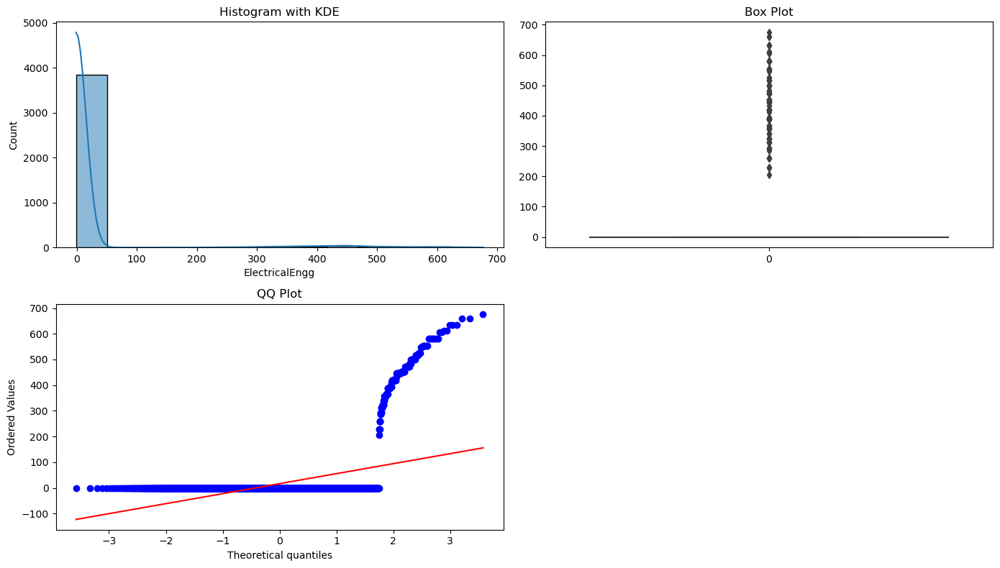

********** TelecomEngg **********
min        -1.000000
max       548.000000
mean       31.851176
median     -1.000000
std       104.852845
skew        3.041261
kurt        7.810221
Name: TelecomEngg, dtype: float64


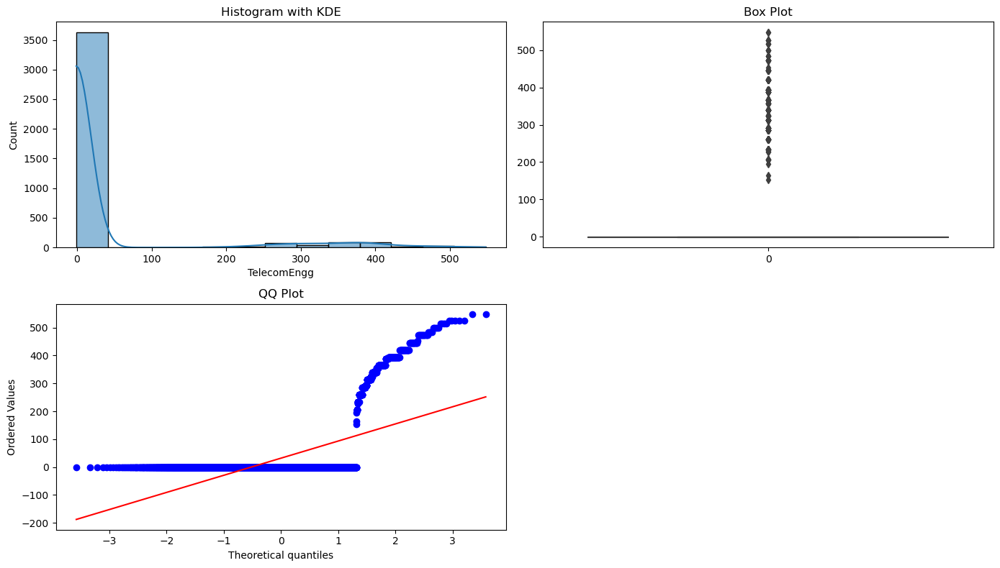

********** CivilEngg **********
min        -1.000000
max       516.000000
mean        2.683842
median     -1.000000
std        36.658505
skew       10.315681
kurt      109.041349
Name: CivilEngg, dtype: float64


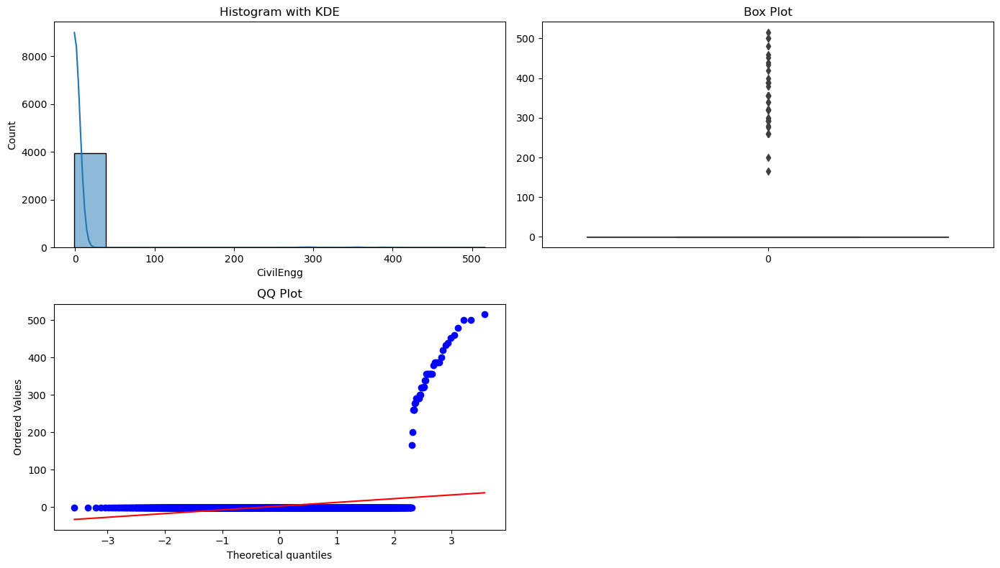

********** conscientiousness **********
min      -4.126700
max       1.995300
mean     -0.037831
median    0.046400
std       1.028666
skew     -0.527003
kurt      0.122596
Name: conscientiousness, dtype: float64


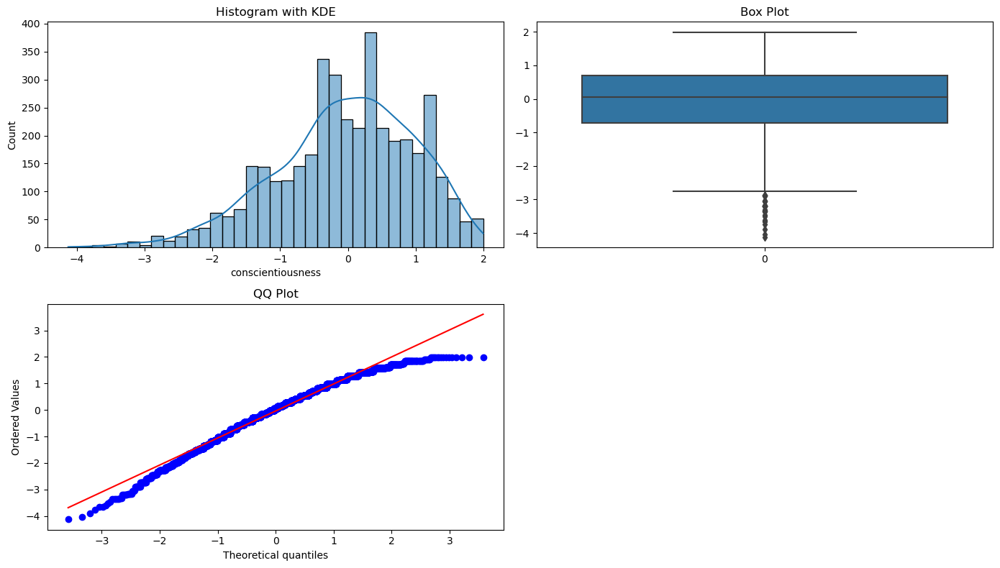

********** agreeableness **********
min      -5.781600
max       1.904800
mean      0.146496
median    0.212400
std       0.941782
skew     -1.204915
kurt      3.391242
Name: agreeableness, dtype: float64


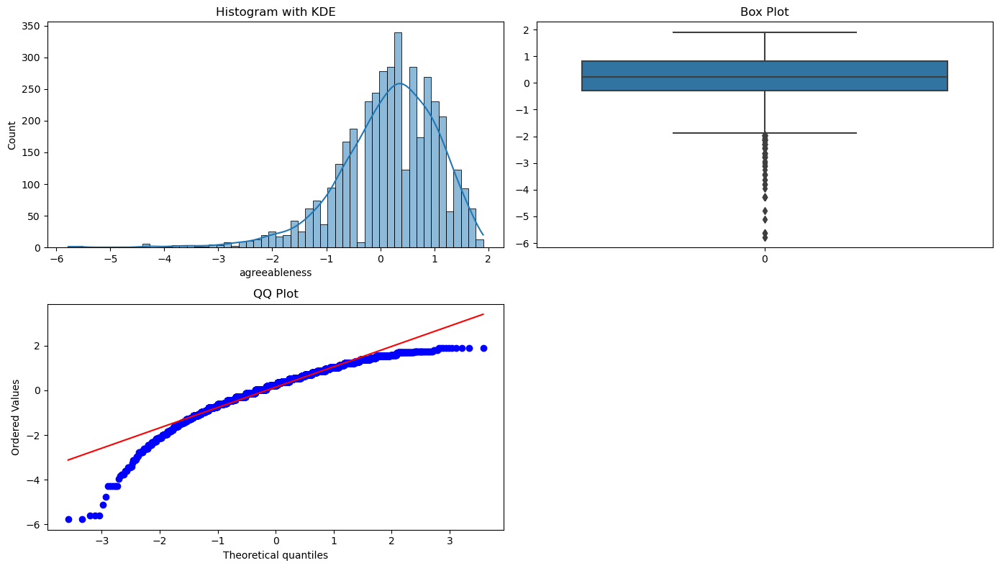

********** extraversion **********
min      -4.600900
max       2.535400
mean      0.002763
median    0.091400
std       0.951471
skew     -0.523267
kurt      0.643969
Name: extraversion, dtype: float64


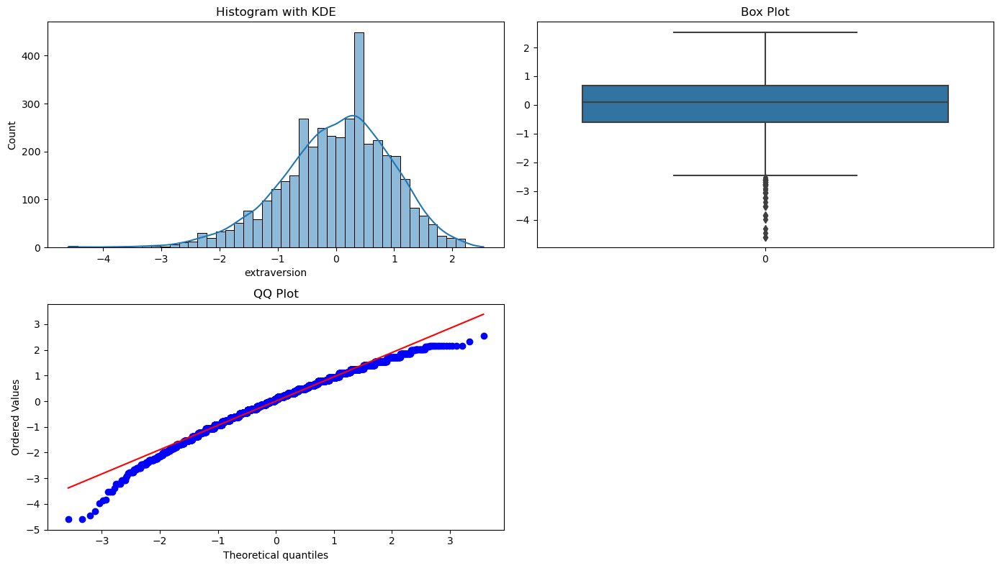

********** nueroticism **********
min      -2.643000
max       3.352500
mean     -0.169033
median   -0.234400
std       1.007580
skew      0.165710
kurt     -0.191539
Name: nueroticism, dtype: float64


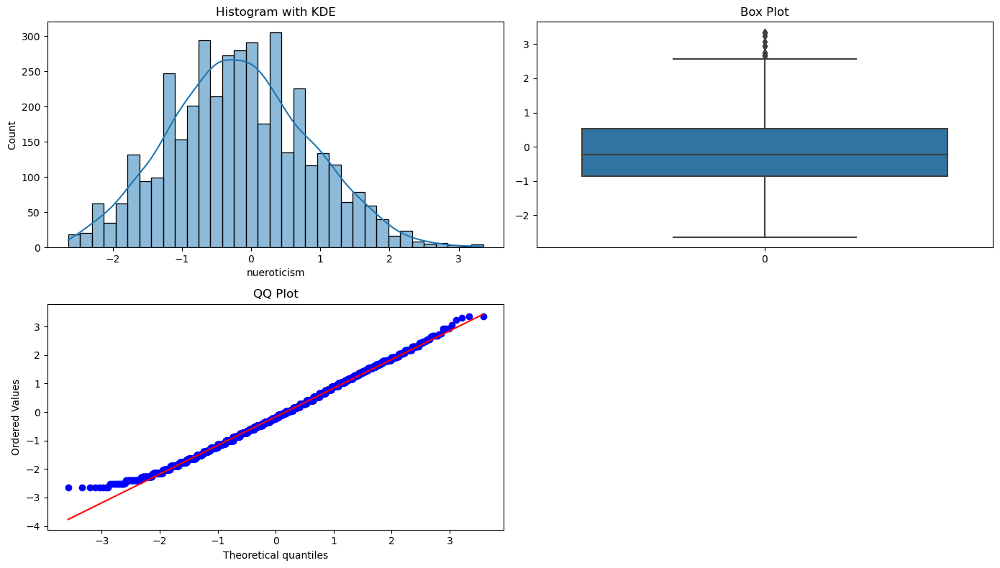

********** openess_to_experience **********
min      -7.375700
max       1.822400
mean     -0.138110
median   -0.094300
std       1.008075
skew     -1.506962
kurt      5.788327
Name: openess_to_experience, dtype: float64


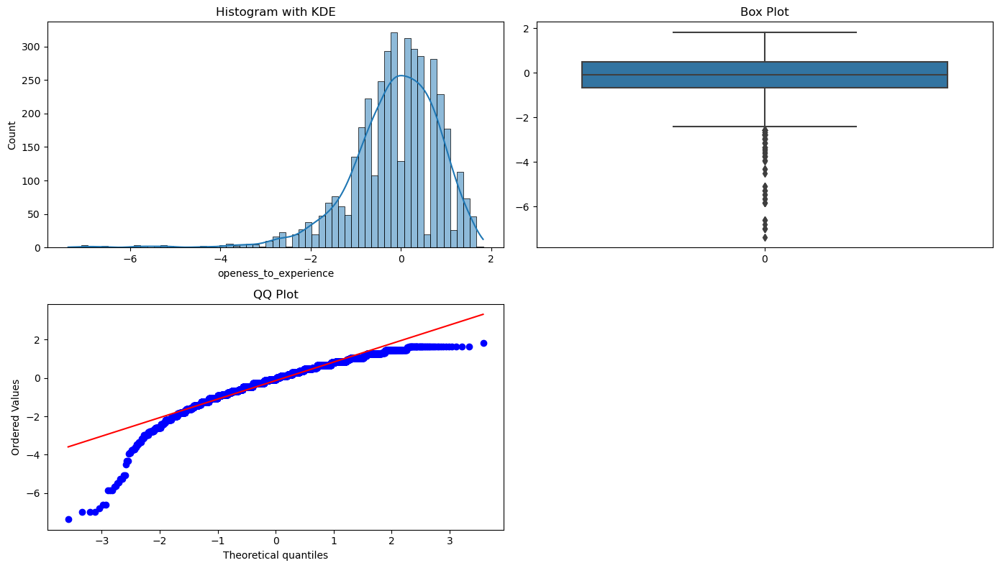

In [353]:
numerical_univariate_analysis(numerical_data)

## Observations of each numerical column

- Salary columns distribution is right skewed and have very large outliers. So, it is not normally distrubuted. To treat them you may consider to remove the extreme outliers
- 10percentage column distribution is moderately skewed with very small outiers. Most of the cadidates scored around 78 percentage in their 10th board exams
- 12percentage column distribution skewness is between -0.5 and 0.5 ie the distribution is approximately symmetric with one or 2 outiers. Most of the cadidates scored around 74 percentage in their 12th board exams
- collegeGPA column distribution is left skewed and have large outliers, treating it by removing the outliers can be considered. most of the candidates got GPA's around 70 percentage.
- English column frequencies have normal distribution, there are no outliers and skewness. Average marks scored by the candidates is 500 marks in the english section
- Logical column distribution is normal, there are no outliers and skewness. Average marks scored by the candidates is 501 marks in the Logical section 
- Quant  column distribution is normal, there are no outliers and skewness. Average marks scored by the candidates is 513 marks in the Quant section
- Domain variable is not a normal distribution as u can see there are many outliers.
- ComputerProgramming ,ElectronicsAndSemicon ,ComputerScience ,MechanicalEngg ,ElectricalEngg ,TelecomEngg ,CivilEngg all are score columns depending upon their specilization because score with -1 value is nothing but they are not specilized in that section/subject so they did not attept that perticuler section. so, adding all these section scores can give us total score of the specilization section in Amcat exam.
- conscientiousness,extraversion,nueroticism columns distributions are moderately skewed with very small outiers. I am considering not to remove the outliers as they are very small.
- agreeableness,openess_to_experience column distribution is left skewed and have large outliers, treating it by removing the outliers can be considered

### Fixing Salary column and storing them in clean dataframe

In [908]:
clean_df = data[data["Salary"]<1.500000e+06]

min       3.500000e+04
max       1.320000e+06
mean      2.980671e+05
median    3.000000e+05
std       1.525655e+05
skew      1.498449e+00
kurt      5.190462e+00
Name: Salary, dtype: float64


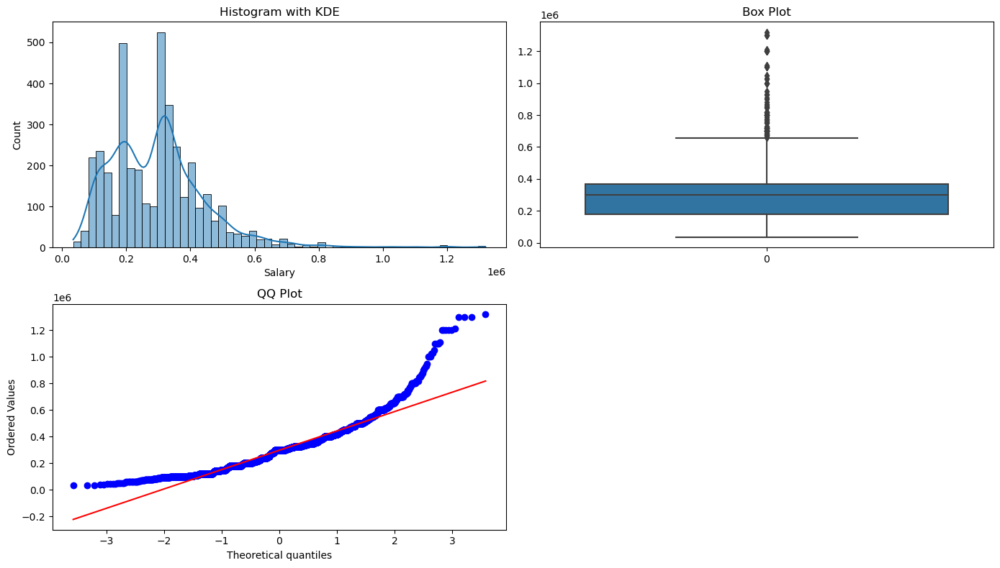

In [909]:
single_col_numerical_univariate_analysis(clean_df["Salary"])

In [910]:
clean_df["Salary"].mean()

298067.1022870068

In [911]:
clean_df["Salary"].median()

300000.0

- After removing extreme outliers we have achieve to remove highly skewed data and now it is near to normal distribution
- Most of the candidates salaries are around 2 to 3 lakhs Annual CTC .

### Fixing collegeGPA column and storing them in clean dataframe

In [912]:
clean_df=clean_df[clean_df["collegeGPA"]>20]

min       49.070000
max       99.930000
mean      71.680950
median    71.800000
std        7.390942
skew       0.162522
kurt       0.085848
Name: collegeGPA, dtype: float64


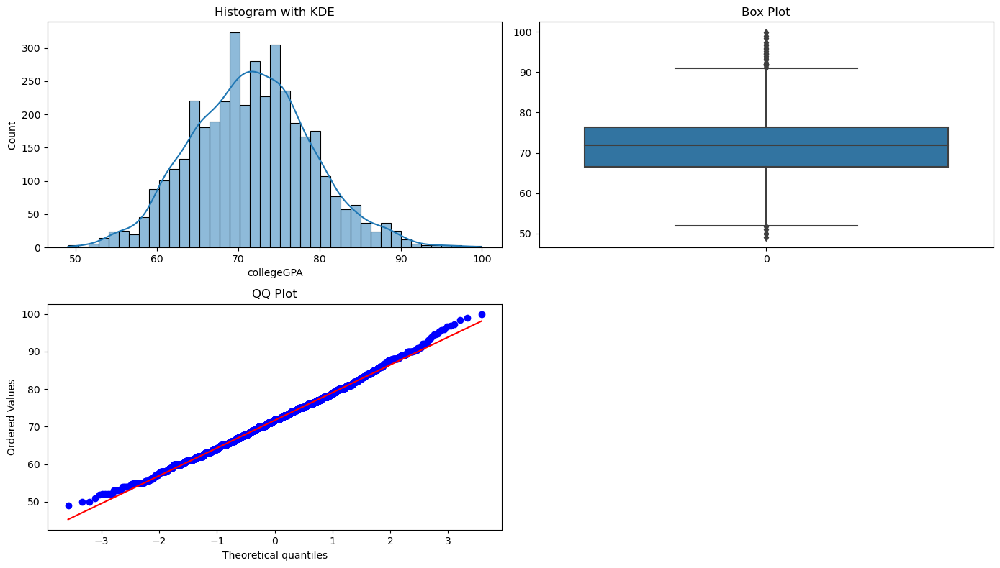

In [913]:
single_col_numerical_univariate_analysis(clean_df["collegeGPA"])

- After removing extreme outliers we have achieve to remove skewed data and now the data has normal distribution
- Most of the candidates have Collage GPA around 70 percentage

### Fixing 'ComputerProgramming','ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg','ElectricalEngg', 'TelecomEngg', 'CivilEngg' columns by adding all of them

In [914]:
scores = clean_df[['ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
       'ElectricalEngg', 'TelecomEngg', 'CivilEngg']]

In [915]:
scores=scores.replace(-1, 0)


In [916]:
clean_df["Specilized section Total scores"]=scores.sum(axis=1)

min          0.000000
max       1684.000000
mean       618.851273
median     575.000000
std        269.233074
skew         0.284889
kurt         0.192562
Name: Specilized section Total scores, dtype: float64


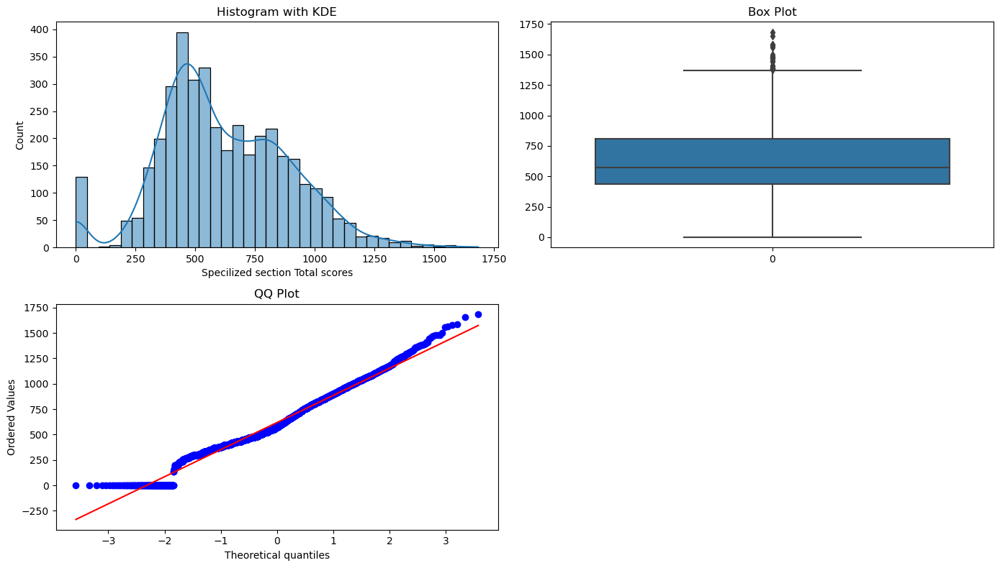

In [917]:
single_col_numerical_univariate_analysis(clean_df["Specilized section Total scores"])

- After adding 'ComputerProgramming','ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg','ElectricalEngg', 'TelecomEngg', 'CivilEngg' columns, all these columns are sections in AMCAT exam which are related to thier specilization we have achieved nearly a normal distribution. This Specilized section Total scores column can used while creating the model instead of all those columns with many outlier values
- Most of the candidates scored marks between 400 to 600 in thier specilization section column

# Step - 4 
# Bivariate Analysis

## a. Continuous vs Continuous Numerical Data

In [918]:
clean_df.drop(["ID","CollegeID","CollegeCityID"],axis=1,inplace=True)

In [919]:
numerical_Cols_clean_df =  clean_df[['Salary', '10percentage', '12percentage', 'collegeGPA', 'English',
       'Logical', 'Quant', 'Domain',  'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience','Specilized section Total scores']]

In [920]:
numerical_Cols_clean_df.corr()

,Salary,10percentage,12percentage,collegeGPA,English,Logical,Quant,Domain,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Specilized section Total scores
Salary,1.000000,0.249300,0.235089,0.213700,0.234100,0.221847,0.334411,0.152771,-0.057099,0.063042,-0.018098,-0.066976,-0.007177,0.027210
10percentage,0.249300,1.000000,0.642650,0.338672,0.349157,0.313747,0.316668,0.076679,0.068332,0.136587,-0.004206,-0.131430,0.033985,0.143987
12percentage,0.235089,0.642650,1.000000,0.387342,0.212803,0.242409,0.313529,0.070928,0.058154,0.103834,-0.006218,-0.093431,0.003923,0.154028
collegeGPA,0.213700,0.338672,0.387342,1.000000,0.109565,0.212143,0.241293,0.120080,0.079239,0.070398,-0.038334,-0.082133,0.026959,0.140127
English,0.234100,0.349157,0.212803,0.109565,1.000000,0.442794,0.372645,0.091033,0.035414,0.194102,0.019508,-0.155401,0.067301,0.153978
Logical,0.221847,0.313747,0.242409,0.212143,0.442794,1.000000,0.498374,0.168204,0.027756,0.165378,-0.007690,-0.179945,0.046304,0.159702
Quant,0.334411,0.316668,0.313529,0.241293,0.372645,0.498374,1.000000,0.209135,-0.004764,0.103844,-0.027759,-0.132077,0.020124,0.170130
Domain,0.152771,0.076679,0.070928,0.120080,0.091033,0.168204,0.209135,1.000000,-0.037663,0.052112,-0.024310,-0.017547,0.008719,0.367896
conscientiousness,-0.057099,0.068332,0.058154,0.079239,0.035414,0.027756,-0.004764,-0.037663,1.000000,0.483135,0.358961,-0.329807,0.396529,0.056295
agreeableness,0.063042,0.136587,0.103834,0.070398,0.194102,0.165378,0.103844,0.052112,0.483135,1.000000,0.455212,-0.209610,0.591303,0.044948


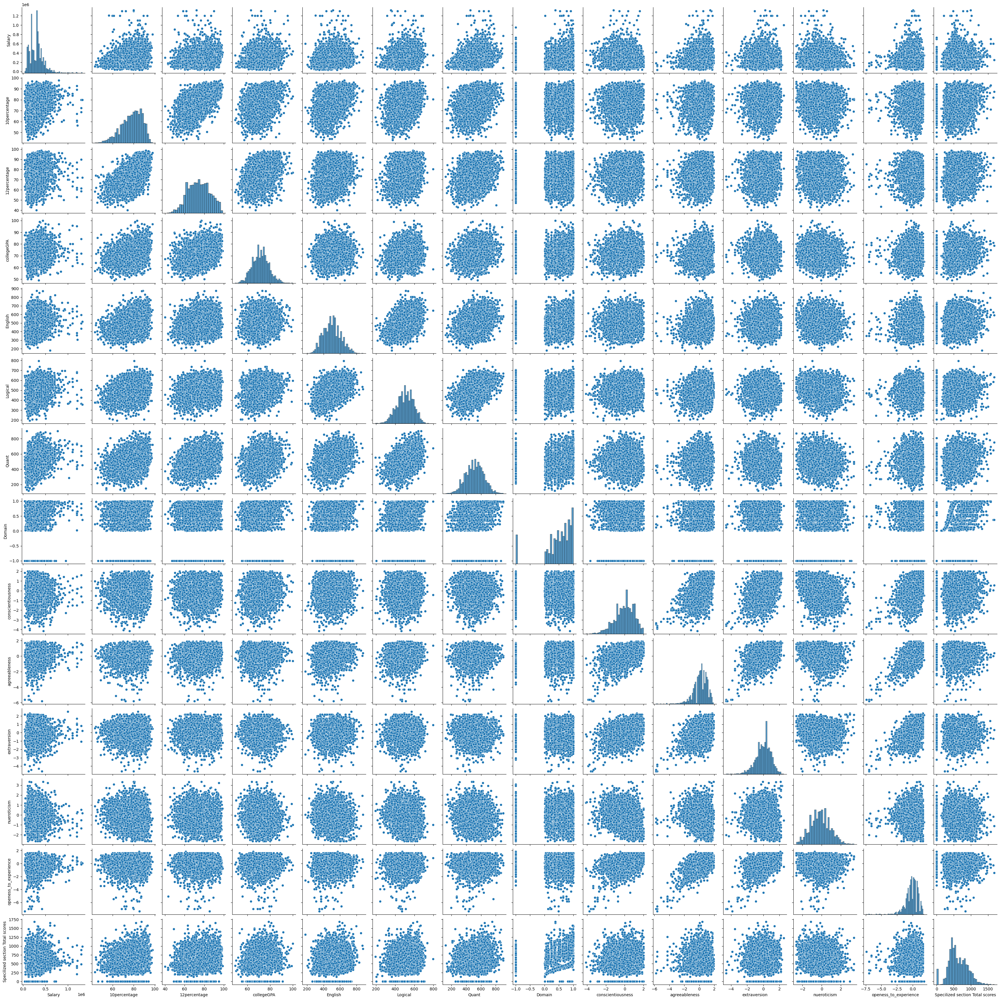

In [921]:
sns.pairplot(numerical_Cols_clean_df)

- Pair plot between all contiuous numerical variables

### Salary vs other continuous variables

<Axes: xlabel='10percentage', ylabel='Salary'>

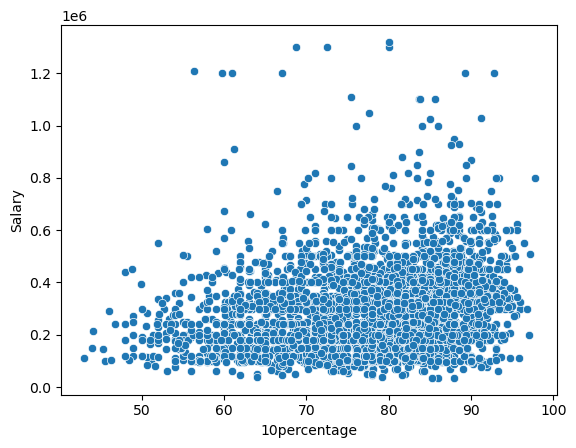

In [922]:
sns.scatterplot(x='10percentage', y='Salary',data=clean_df)

- The scatter plot represents relationship between 10th percentage and salary variables. The graph shows that their is weak positive correlation and no linear relationship between the two variables.

<Axes: xlabel='12percentage', ylabel='Salary'>

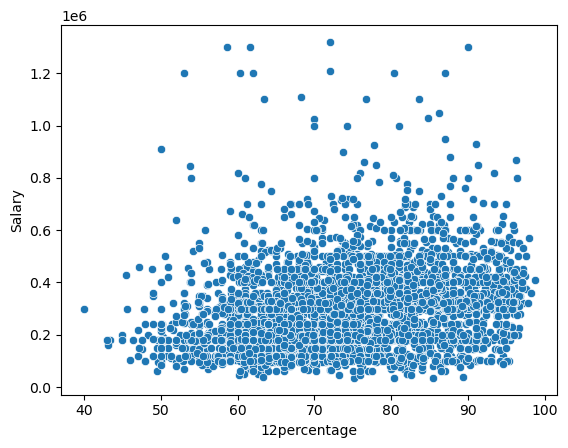

In [925]:
sns.scatterplot(x='12percentage', y='Salary',data=clean_df)

- The scatter plot represents relationship between 12th percentage and salary variables. In the graph the data points shows no  linear relationship between the two variables. That means there is no relation between the students 12th percentage and thier salaries

<Axes: xlabel='collegeGPA', ylabel='Salary'>

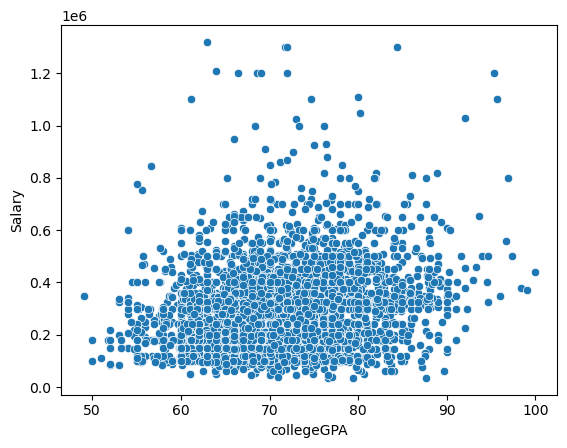

In [926]:
sns.scatterplot(x='collegeGPA', y='Salary',data=clean_df)

- The scatter plot represents relationship between 10th percentage and salary variables. The graph shows that their is weak positive correlation  and have no linear relationshp between the two variables.
- From this we cannot say that candidates with high GPA have high salaries as you can see even with average GPA, some of them have high salaries and some of them have low salaries

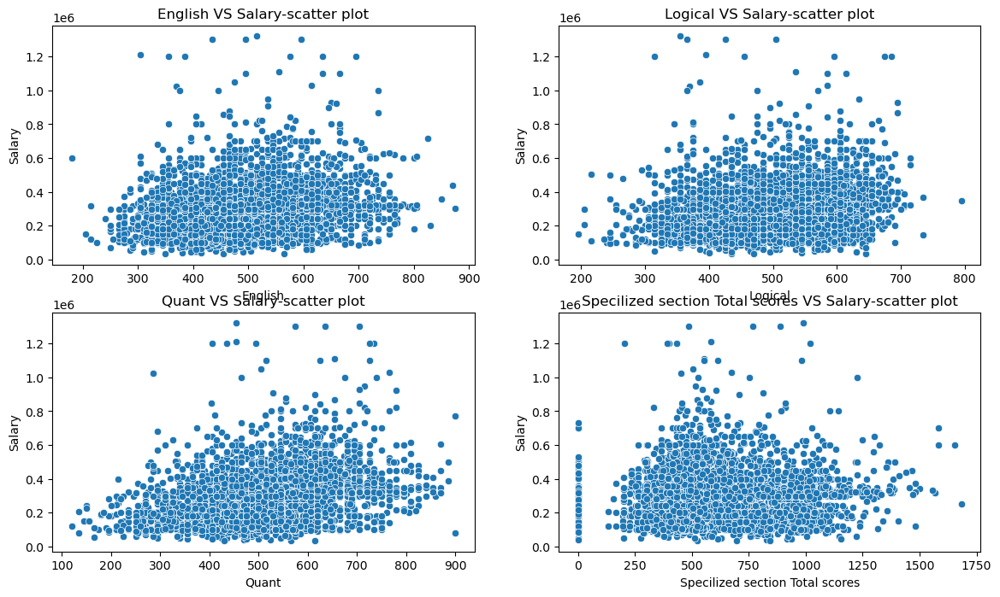

In [927]:
fig, axs = plt.subplots(2, 2, figsize=(14, 8))

plt.subplot(2, 2, 1)
sns.scatterplot(x='English', y='Salary',data=clean_df)
axs[0,0].set_title('English VS Salary-scatter plot')

plt.subplot(2, 2, 2)
sns.scatterplot(x='Logical', y='Salary',data=clean_df)
axs[0,1].set_title('Logical VS Salary-scatter plot')

plt.subplot(2, 2, 3)
sns.scatterplot(x='Quant', y='Salary',data=clean_df)
axs[1, 0].set_title('Quant VS Salary-scatter plot')

plt.subplot(2, 2, 4)
sns.scatterplot(x='Specilized section Total scores', y='Salary',data=clean_df)
axs[1, 1].set_title('Specilized section Total scores VS Salary-scatter plot')


plt.show()

- The scatter plot represents relationship between (English,Logical,Quant,Specilized section Total scores) these subject section and salary variables. The graph shows that their is weak positive correlation and have no linear relationshiop between all variable vs salary variable. From the graph we can say that even though they have high or low scores in subject section in AMCAT exam they all have less salaries as well as high salaries.

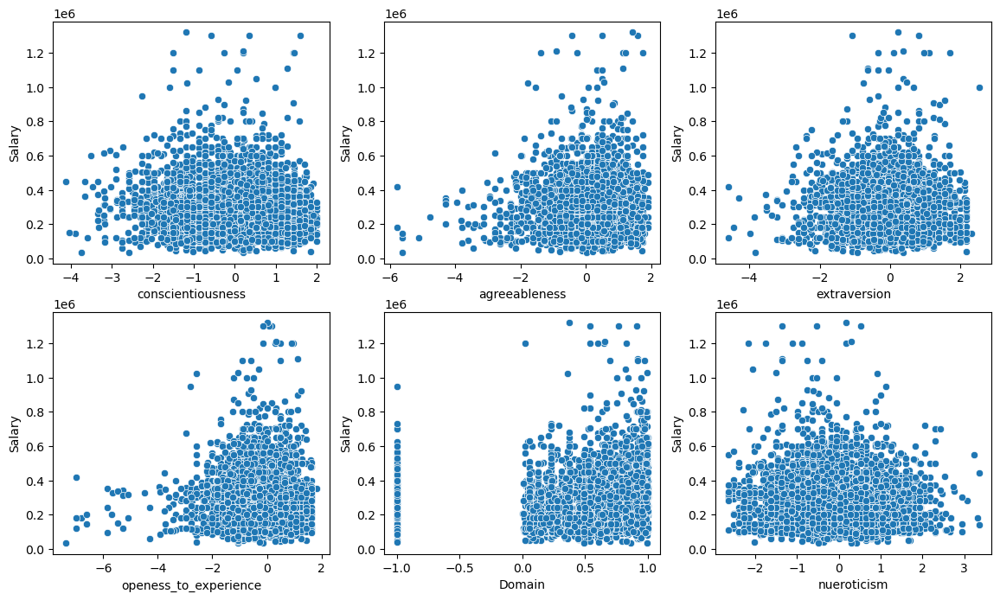

In [928]:
fig, axs = plt.subplots(2, 3, figsize=(14, 8))

plt.subplot(2, 3, 1)
sns.scatterplot(x='conscientiousness', y='Salary',data=clean_df)

plt.subplot(2, 3, 2)
sns.scatterplot(x='agreeableness', y='Salary',data=clean_df)

plt.subplot(2, 3, 3)
sns.scatterplot(x='extraversion', y='Salary',data=clean_df)

plt.subplot(2, 3, 4)
sns.scatterplot(x='openess_to_experience', y='Salary',data=clean_df)


plt.subplot(2, 3, 5)
sns.scatterplot(x='Domain', y='Salary',data=clean_df)

plt.subplot(2, 3, 6)
sns.scatterplot(x='nueroticism', y='Salary',data=clean_df)

plt.show()

- All of the above variables are not linearly related to salary column, and all graphs shows that their is weak positive correlations

### 10percentage vs 12percentage 

<Axes: xlabel='10percentage', ylabel='12percentage'>

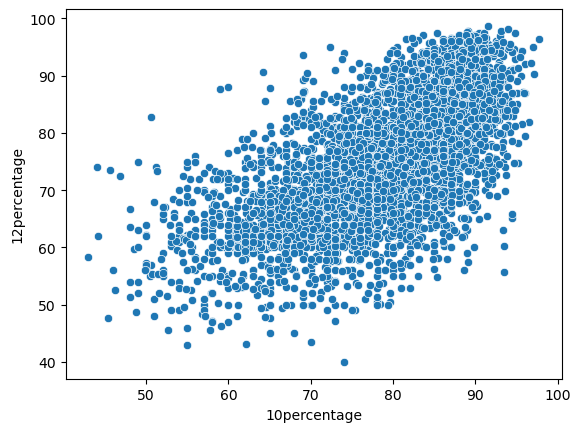

In [929]:
sns.scatterplot(x='10percentage', y='12percentage',data=clean_df)

- In this graph we can see a positive linear relation between 10th percentage and 12th percentage. That means the candidates who have got high percentage in 10th board also got high percentage in 12th board

### 10percentage vs collegeGPA 

<Axes: xlabel='10percentage', ylabel='collegeGPA'>

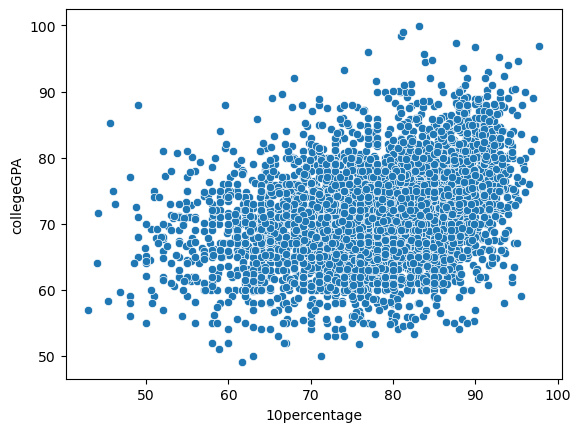

In [930]:
sns.scatterplot(x='10percentage', y='collegeGPA',data=clean_df)

- In this graph we can see a positive linear relation between 10th percentage and collegeGPA. That means the candidates who have got high percentage in 10th board also got high collage GPA

### 12percentage vs collegeGPA variables

<Axes: xlabel='12percentage', ylabel='collegeGPA'>

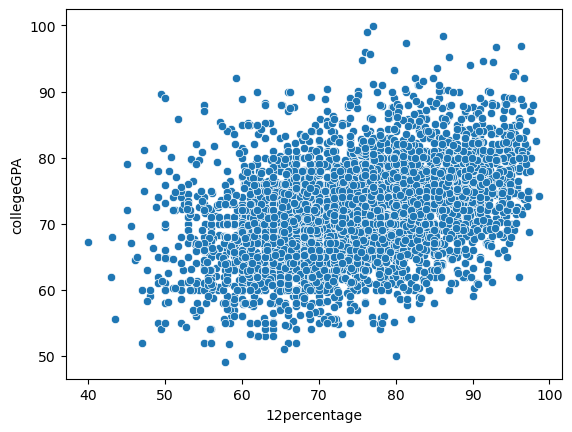

In [931]:
sns.scatterplot(x='12percentage', y='collegeGPA',data=clean_df)

- In this graph we can see a positive linear relation between 12th percentage and collegeGPA. That means the candidates who have got high percentage in 12th board also got high collage GPA

In [932]:
numerical_Cols_clean_df.columns

Index(['Salary', '10percentage', '12percentage', 'collegeGPA', 'English',
       'Logical', 'Quant', 'Domain', 'conscientiousness', 'agreeableness',
       'extraversion', 'nueroticism', 'openess_to_experience',
       'Specilized section Total scores'],
      dtype='object')

### openess_to_experience vs agreeableness

<Axes: xlabel='openess_to_experience', ylabel='agreeableness'>

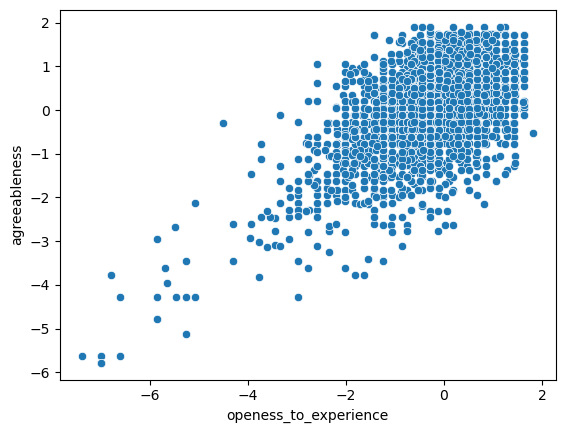

In [933]:
sns.scatterplot(x='openess_to_experience', y='agreeableness',data=clean_df)

- Most of the candidates who have highly open to experience are also highly agreeable

### b. Discrete vs Discrete Data

In [936]:
pd.crosstab(clean_df['Designation'], clean_df['Gender'])

Gender,f,m
Designation,,
.net developer,8,26
.net web developer,1,3
account executive,2,2
account manager,0,1
admin assistant,0,2
...,...,...
web designer and seo,1,0
web developer,17,36
web intern,1,0


In [937]:
pd.crosstab(clean_df['JobCity'], clean_df['Gender'])

Gender,f,m
JobCity,,
agra,0,2
ahmedabad,2,17
ahmednagar,0,2
"al jubail,saudi arabia",0,1
allahabad,1,0
...,...,...
varanasi,0,1
vellore,1,0
vijayawada,1,1


- Most of the Female candidates are from electronics and communication engineering Specialization

<Axes: xlabel='GraduationYear'>

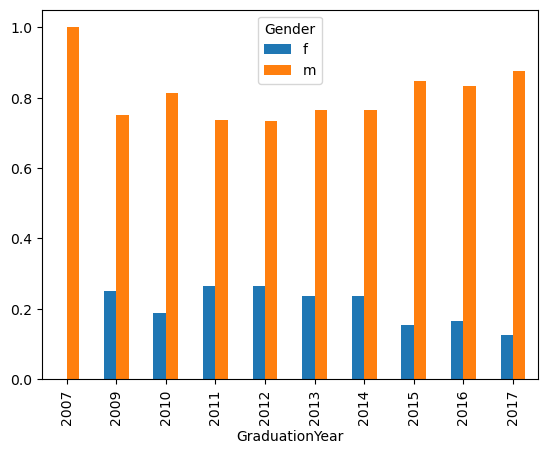

In [938]:
tab = pd.crosstab( clean_df['GraduationYear'],clean_df['Gender'],normalize='index')
tab.plot(kind='bar')

- Candidates who are graduated in 2007 are all male and Most of the Female candidates graduated in 2011 and 2012

<Axes: xlabel='CollegeState'>

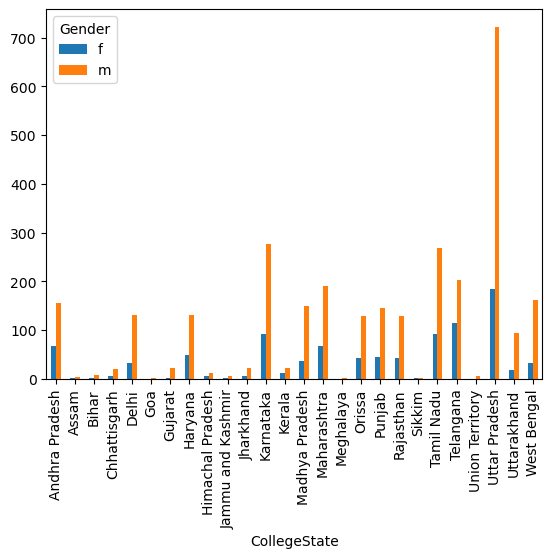

In [939]:
tab = pd.crosstab( clean_df['CollegeState'],clean_df['Gender'])
tab.plot(kind='bar')

- Most of the female candidates are in telangana  and Utter Pradesh state colleges and there are only male candidates present in Goa,Meggalaya unioin Territory state colleges

<Axes: ylabel='CollegeState'>

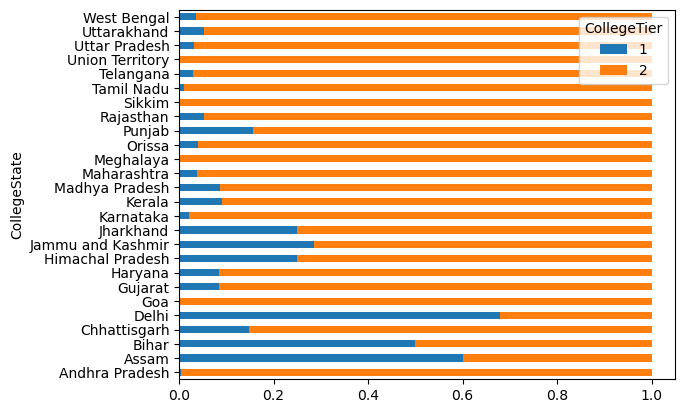

In [940]:
tab = pd.crosstab( clean_df['CollegeState'],clean_df['CollegeTier'],normalize='index')

tab.plot(kind='barh', stacked=True)

- Most of the candidates from Tier one colleges present in Delhi state and candidates from Andhra Pradesh,Goa,Meghalaya and sikkim are only from Tier 2 colleges. And we can say that candidates mostly are from Tier 2 colleges

### c. Continuous Numerical vs Discrete Data

In [941]:
group = clean_df.groupby('Gender')

group['Salary'].agg(['min', 'max', 'mean', 'median'])

,min,max,mean,median
Gender,,,,
f,35000.0,1200000.0,286559.873950,300000.0
m,35000.0,1320000.0,301590.049751,300000.0


<Axes: xlabel='Gender', ylabel='Salary'>

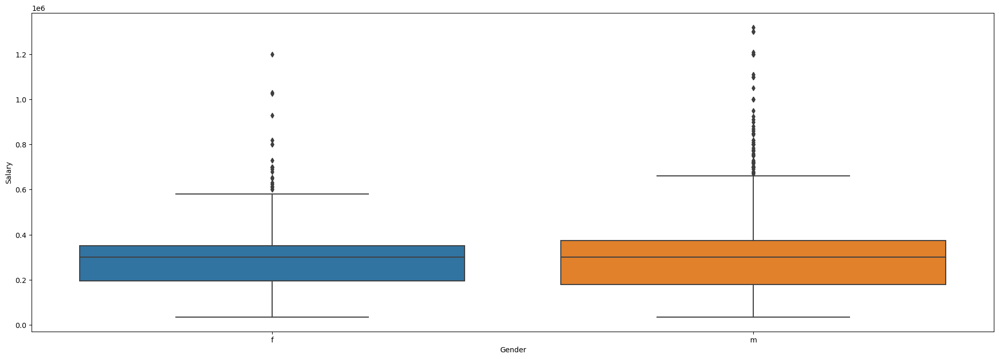

In [942]:
plt.figure(figsize=(24,8))
sns.boxplot(x='Gender', y='Salary',data=clean_df)

- The Average salaries of both Female and male are same. Male candidate has the highest salary value than Female and Lowest are same are same for both
- As the means of salary are same for both Male and Female, That means the both variables are not related to each other

In [943]:
group = clean_df.groupby('CollegeTier')

group['Salary'].agg(['min', 'max', 'mean', 'median'])


,min,max,mean,median
CollegeTier,,,,
1,100000.0,1300000.0,415120.274914,350000.0
2,35000.0,1320000.0,288710.282916,300000.0


<Axes: xlabel='CollegeTier', ylabel='Salary'>

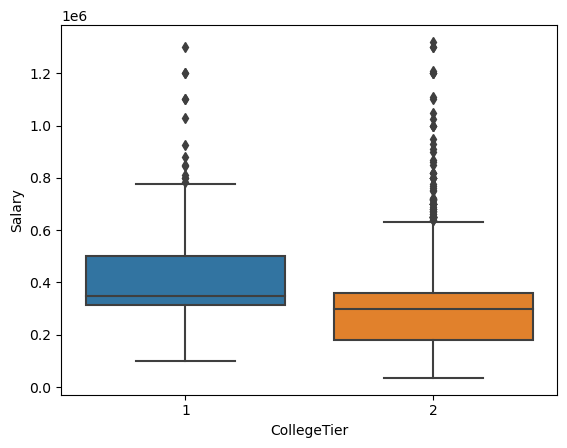

In [944]:
plt.figure()
sns.boxplot(x='CollegeTier', y='Salary',data=clean_df)

- The means of the both CollegeTier categories are different ie they are related to each other
- We can say that candidates from tier 1 colleges have higher salaries

In [945]:
group = clean_df.groupby('Degree')

group['Salary'].agg(['min', 'max', 'mean', 'median'])


,min,max,mean,median
Degree,,,,
B.Tech/B.E.,35000.0,1320000.0,300152.108844,300000.0
M.Sc. (Tech.),180000.0,460000.0,320000.000000,320000.0
M.Tech./M.E.,40000.0,1200000.0,330306.122449,335000.0
MCA,50000.0,1200000.0,258153.526971,215000.0


<Axes: xlabel='Degree', ylabel='Salary'>

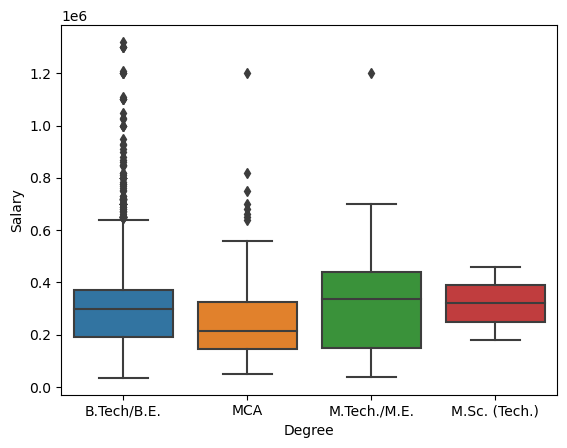

In [946]:
plt.figure()
sns.boxplot(x='Degree', y='Salary',data=clean_df)

- The means of the all Degree categories are different. ie, Degree and salary variables are related to each other
- From the graph we can say that M.Tech/M.E degree candidates have higher salaries

In [947]:
group = clean_df.groupby('GraduationYear')

group['Salary'].agg(['min', 'max', 'mean', 'median'])

,min,max,mean,median
GraduationYear,,,,
2007,120000.0,120000.0,120000.000000,120000.0
2009,95000.0,860000.0,365625.000000,280000.0
2010,50000.0,1320000.0,411297.577855,395000.0
2011,35000.0,1100000.0,354730.000000,352500.0
2012,45000.0,1300000.0,309668.246445,310000.0
2013,40000.0,1030000.0,271113.095238,275000.0
2014,35000.0,820000.0,261546.692607,275000.0
2015,60000.0,1025000.0,271208.791209,250000.0
2016,100000.0,350000.0,278333.333333,307500.0


<Axes: xlabel='GraduationYear', ylabel='Salary'>

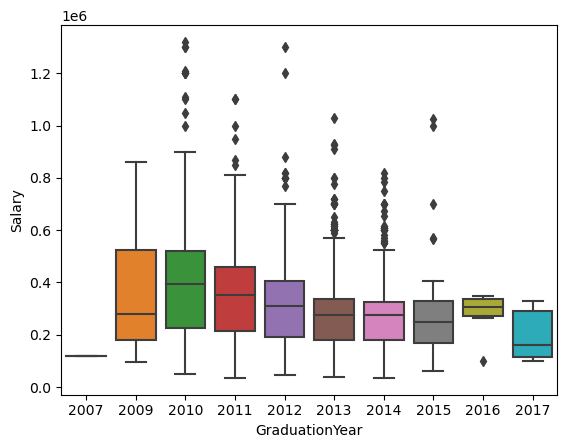

In [948]:
plt.figure()
sns.boxplot(x='GraduationYear', y='Salary',data=clean_df)

- The means of the all GraduationYear categories are different. ie, salary and GraduationYear variables are related to each other
- From the graph we can say that 2010 gaduated candidates have higher salaries

In [949]:
group = clean_df.groupby('CollegeState')

group['Salary'].agg(['min', 'max', 'mean', 'median'])

,min,max,mean,median
CollegeState,,,,
Andhra Pradesh,50000.0,650000.0,305874.439462,305000.0
Assam,300000.0,800000.0,452000.000000,360000.0
Bihar,120000.0,610000.0,287000.000000,185000.0
Chhattisgarh,95000.0,550000.0,261666.666667,240000.0
Delhi,70000.0,1200000.0,363179.012346,330000.0
Goa,450000.0,450000.0,450000.000000,450000.0
Gujarat,80000.0,1200000.0,321666.666667,227500.0
Haryana,90000.0,950000.0,299916.666667,277500.0
Himachal Pradesh,110000.0,570000.0,320312.500000,307500.0


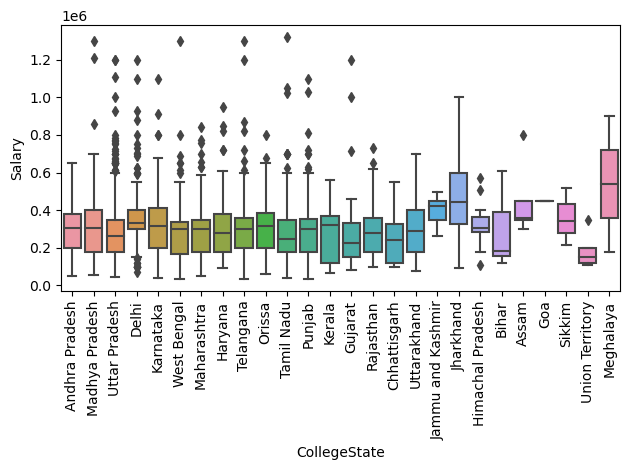

In [950]:
plt.figure()
sns.boxplot(x='CollegeState', y='Salary',data=clean_df)
plt.xticks(rotation=90)
plt.tight_layout()

- The means of the all CollegeState categories are different. ie, salary and CollegeState variables are related to each other

In [951]:
group = clean_df.groupby('CollegeTier')

group['12percentage'].agg(['min', 'max', 'mean', 'median'])

,min,max,mean,median
CollegeTier,,,,
1,47.2,97.8,78.169588,79.6
2,40.0,98.7,74.162225,74.0


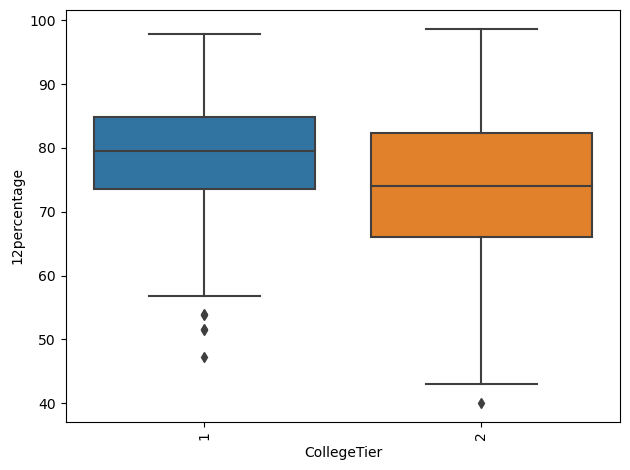

In [952]:
plt.figure()
sns.boxplot(x='CollegeTier', y='12percentage',data=clean_df)
plt.xticks(rotation=90)
plt.tight_layout()

In [ ]:
grp1=data.loc[data["Gender"]=='m',"CreditScore"]
grp2=data.loc[data["Gender"]=='f',"CreditScore"]
sns.distplot(grp1)
sns.distplot(grp2)

In [953]:
group = clean_df.groupby('GraduationYear')

group['collegeGPA'].agg(['min', 'max', 'mean', 'median'])

,min,max,mean,median
GraduationYear,,,,
2007,64.70,64.70,64.700000,64.700
2009,55.70,96.00,68.443333,66.650
2010,53.00,98.40,69.955052,70.000
2011,50.00,97.30,69.675760,69.680
2012,50.00,99.00,72.165450,72.170
2013,49.07,99.93,72.137900,71.920
2014,52.00,96.70,72.283696,72.500
2015,55.00,91.00,72.094725,72.200
2016,67.60,80.00,73.488333,71.675


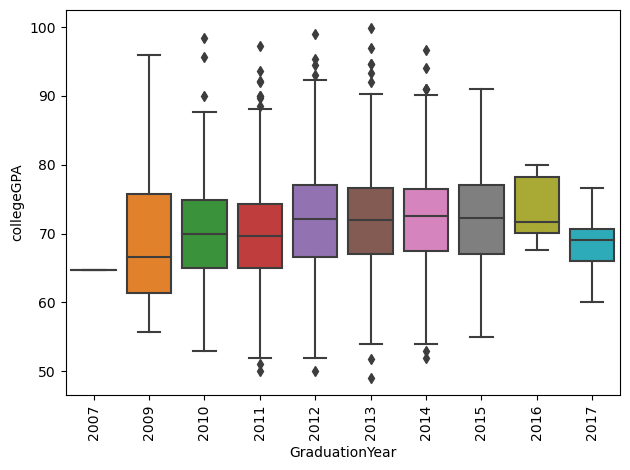

In [954]:
plt.figure()
sns.boxplot(x='GraduationYear', y='collegeGPA',data=clean_df)
plt.xticks(rotation=90)
plt.tight_layout()

- The means of GraduationYear are almost same, so GraduationYear and collegeGPA are not related to each other. So, we can say that mean of candidates college GPAs in all the GraduationYear are same

In [955]:
group = clean_df.groupby('CollegeTier')

group['collegeGPA'].agg(['min', 'max', 'mean', 'median'])

,min,max,mean,median
CollegeTier,,,,
1,54.00,99.93,74.400309,74.33
2,49.07,99.00,71.465680,71.43


<Axes: xlabel='CollegeTier', ylabel='collegeGPA'>

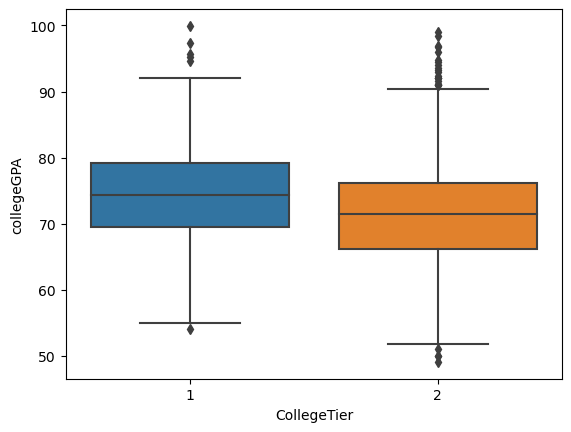

In [956]:
plt.figure()
sns.boxplot(x='CollegeTier', y='collegeGPA',data=clean_df)

- The means of college tier are almost same, so CollegeTier and collegeGPA are not related to each other. So, college tier is nothing to do with candidates college GPA 

<Axes: >

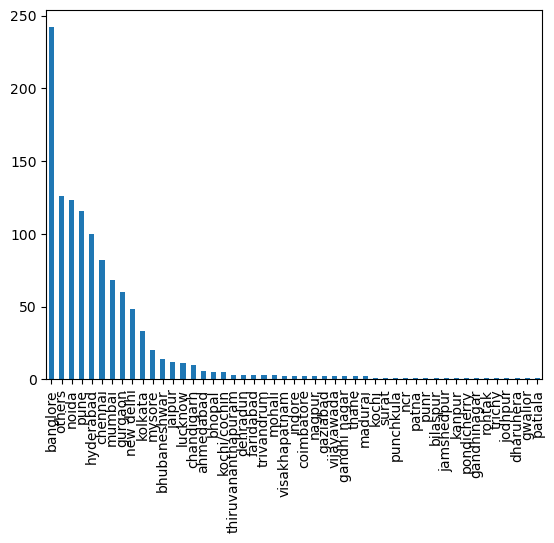

In [1024]:
clean_df['JobCity'][(clean_df['Designation']=='software engineer') |
    (clean_df['Designation']=='systems engineer')|
    (clean_df['Designation']=='software developer')].value_counts().plot.bar()

- Most of the software engineer,systems engineer and software developer jod city is Banglore

# Step - 5 - Research Questions

#### Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.
- The relation between Specialization, Designation and Salary columns
- $H_0 - Null Hypothesis(CLAIM)$  - After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” is True
- $H_A - Alternate Hypothesis(Contradiction)$ - After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” is False

In [986]:
design_sal = clean_df[['Designation','Salary']][(clean_df["Specialization"]=='computer science') | 
                                               (clean_df["Specialization"]=='computer science and technology')]
design_sal

,Designation,Salary
6,java software engineer,300000.0
18,data entry operator,120000.0
24,programmer analyst,335000.0
25,systems analyst,435000.0
31,software engineer,340000.0
...,...,...
3969,technical engineer,330000.0
3975,game developer,300000.0
3981,software engineer,220000.0
3989,software engineer,300000.0


In [988]:
design_sal_shortlist = design_sal[(design_sal['Designation']=='hardware engineer') | (design_sal['Designation']=='programmer analyst') 
          | (design_sal['Designation']=='programmer analyst trainee') | 
           (design_sal['Designation']=='software engineer') | (design_sal['Designation']=='junior software engineer')
          | (design_sal['Designation']=='trainee software engineer') | (design_sal['Designation']=='associate engineer')]

In [995]:
group = design_sal_shortlist.groupby('Designation')

group['Salary'].agg(['mean'])

,mean
Designation,
associate engineer,332500.000000
junior software engineer,298750.000000
programmer analyst,323846.153846
programmer analyst trainee,315000.000000
software engineer,331773.049645
trainee software engineer,240000.000000


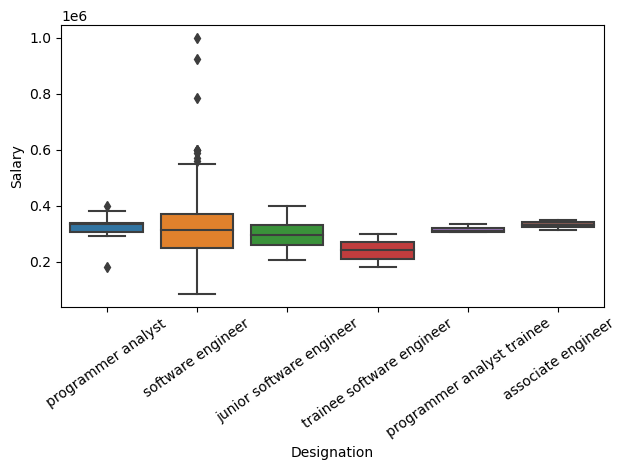

In [1000]:
plt.figure()
sns.boxplot(x='Designation', y='Salary',data=design_sal_shortlist)
plt.xticks(rotation=35)
plt.tight_layout()

- From the above analysis and Graph shows that all the above mentioned jobs average salaries are from 240000 to 332500.
- Hence, we can claim that Null hypothesis is true ie. After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.”

### Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)

### gender-specialization(cat-cat)--> Chi square test
- $H_0 - Null Hypothesis(CLAIM)$  - Variable are independent (They are not related)
- $H_A - Alternate Hypothesis(Contradiction)$ - variable are dependent (They are related)

In [967]:
two_way_freq=pd.crosstab(clean_df['Specialization'], clean_df['Gender'])
two_way_freq

Gender,f,m
Specialization,,
aeronautical engineering,1,2
applied electronics and instrumentation,2,7
automobile/automotive engineering,0,5
biomedical engineering,2,0
biotechnology,9,6
ceramic engineering,0,1
chemical engineering,1,8
civil engineering,6,23
computer and communication engineering,0,1


In [968]:
from scipy.stats import chi2_contingency

x2_value,p_value,df,expected=chi2_contingency(two_way_freq)

In [969]:
p_value

8.51876983966623e-07

- p-value<0.05 so we reject the null hypothesis and accept atlernate hypothesis there is a significant relationship between the variables
- Now we can say that the preference of Specialisation depends on the Gender

# Step - 6 

# Conclusion

- Univariate analysis: After finding the frequencies abd disrtributions of each variable we have found normal ditrubution with many outliers and missing values in the data and but after treating the outliers and missing we have achieved many the normal distribution.

- Bivariate analysis: 
  1. For the Correlation Analysis we have plotted scatter plots and found correlation coefficients throught the analysis the variables which have the moderately positive or negative correlations. they are:  
    - 10percentage', '12percentage', 'collegeGPA' variables 
    - 'openess_to_experience','agreeableness'
    - all numerical the varibles have shown a weak positive and non linear correlation with the Salary (Target) variable
  2. Using frequency tables,boxplots and stacked barplots we have found many relationships between the variables. The variables that are highly related to each other are:
    - 'CollegeTier', 'Salary' variables
    - Degree and salary variables 
    - salary and CollegeState variables
    - salary and GraduationYear variables
    - salary and CollegeState variables
    - Specialisation and Gender variables


# Step - 7 
 (Bonus) Come up with some interesting conclusions or research questions (such as step-5).

- Most of the software engineer,systems engineer and software developer jod city is Banglore
- The college tier has no effect on the candidates GPAs. Which ever the collage tier may be the candidates college gpa averages are same